# 9Day subsampling on the OceanColor Dataset

In [2]:
import xarray as xr
import numpy as np
import pandas as pd
%matplotlib inline
from matplotlib import pyplot as plt
from dask.diagnostics import ProgressBar
import seaborn as sns
from matplotlib.colors import LogNorm

## Load data from disk

We already downloaded a subsetted MODIS-Aqua chlorophyll-a dataset for the Arabian Sea.

We can read all the netcdf files into one xarray Dataset using the `open_mfsdataset` function. Note that this does not load the data into memory yet. That only happens when we try to access the values.

In [3]:
ds_8day = xr.open_mfdataset('./data_collector_modisa_chla9km/ModisA_Arabian_Sea_chlor_a_9km_*_8D.nc')
ds_daily = xr.open_mfdataset('./data_collector_modisa_chla9km/ModisA_Arabian_Sea_chlor_a_9km_*_D.nc')
both_datasets = [ds_8day, ds_daily]

How much data is contained here? Let's get the answer in MB.

In [4]:
print([(ds.nbytes / 1e6) for ds in both_datasets])

[534.295504, 4241.4716]


The 8-day dataset is ~534 MB while the daily dataset is 4.2 GB. These both easily fit in RAM. So let's load them all into memory

In [5]:
[ds.load() for ds in both_datasets]

[<xarray.Dataset>
 Dimensions:        (eightbitcolor: 256, lat: 276, lon: 360, rgb: 3, time: 667)
 Coordinates:
   * lat            (lat) float64 27.96 27.87 27.79 27.71 27.62 27.54 27.46 ...
   * lon            (lon) float64 45.04 45.13 45.21 45.29 45.38 45.46 45.54 ...
   * rgb            (rgb) int64 0 1 2
   * eightbitcolor  (eightbitcolor) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 ...
   * time           (time) datetime64[ns] 2002-07-04 2002-07-12 2002-07-20 ...
 Data variables:
     chlor_a        (time, lat, lon) float64 nan nan nan nan nan nan nan nan ...
     palette        (time, rgb, eightbitcolor) float64 -109.0 0.0 108.0 ...,
 <xarray.Dataset>
 Dimensions:        (eightbitcolor: 256, lat: 276, lon: 360, rgb: 3, time: 5295)
 Coordinates:
   * lat            (lat) float64 27.96 27.87 27.79 27.71 27.62 27.54 27.46 ...
   * lon            (lon) float64 45.04 45.13 45.21 45.29 45.38 45.46 45.54 ...
   * rgb            (rgb) int64 0 1 2
   * eightbitcolor  (eightbitcolor) int64 0 

## Fix bad data

In preparing this demo, I noticed that small number of maps had bad data--specifically, they contained large negative values of chlorophyll concentration. Looking closer, I realized that the land/cloud mask had been inverted. So I wrote a function to invert it back and correct the data.

In [6]:
def fix_bad_data(ds):
    # for some reason, the cloud / land mask is backwards on some data
    # this is obvious because there are chlorophyl values less than zero
    bad_data = ds.chlor_a.groupby('time').min() < 0
    # loop through and fix
    for n in np.nonzero(bad_data.values)[0]:
        data = ds.chlor_a[n].values 
        ds.chlor_a.values[n] = np.ma.masked_less(data, 0).filled(np.nan)

In [7]:
[fix_bad_data(ds) for ds in both_datasets]

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/xarray/core/variable.py:1046: RuntimeWarning: invalid value encountered in less
  if not reflexive


[None, None]

In [8]:
ds_8day.chlor_a>0

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/xarray/core/variable.py:1046: RuntimeWarning: invalid value encountered in greater
  if not reflexive


<xarray.DataArray 'chlor_a' (time: 667, lat: 276, lon: 360)>
array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ..., 
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ..., 
        [False, False, False, ..., False, False, False],
        [False, False, False, ...,  True, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ..., 
        [False, False, False, ..., Fal

## Count the number of ocean data points

First we have to figure out the land mask. Unfortunately it doesn't come with the dataset. But we can infer it by counting all the points that have at least one non-nan chlorophyll value.

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/xarray/core/variable.py:1046: RuntimeWarning: invalid value encountered in greater
  if not reflexive


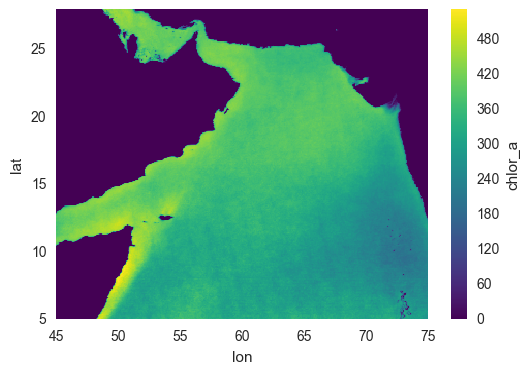

In [9]:
(ds_8day.chlor_a>0).sum(dim='time').plot()

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/xarray/core/variable.py:1046: RuntimeWarning: invalid value encountered in greater
  if not reflexive


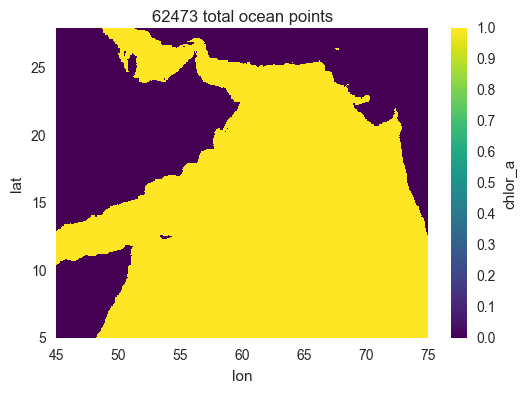

In [10]:
#  find a mask for the land
ocean_mask = (ds_8day.chlor_a>0).sum(dim='time')>0
#ocean_mask = (ds_daily.chlor_a>0).sum(dim='time')>0
num_ocean_points = ocean_mask.sum().values  # compute the total nonzeros regions(data point)
ocean_mask.plot()
plt.title('%g total ocean points' % num_ocean_points)

In [11]:
#ds_8day

In [14]:
#ds_daily

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/colors.py:1022: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


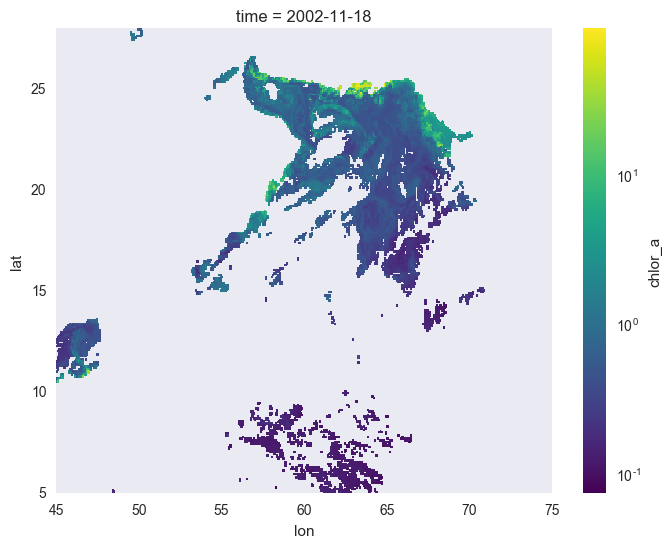

In [16]:
plt.figure(figsize=(8,6))
ds_daily.chlor_a.sel(time='2002-11-18',method='nearest').plot(norm=LogNorm())
#ds_daily.chlor_a.sel(time=target_date, method='nearest').plot(norm=LogNorm())

In [28]:
#list(ds_daily.groupby('time')) # take a look at what's inside

Now we count up the number of valid points in each snapshot and divide by the total number of ocean points.

In [29]:
'''
<xarray.Dataset>
Dimensions:        (eightbitcolor: 256, lat: 144, lon: 276, rgb: 3, time: 4748)
'''
ds_daily.groupby('time').count() # information from original data

<xarray.Dataset>
Dimensions:  (time: 5295)
Coordinates:
  * time     (time) datetime64[ns] 2002-07-04 2002-07-05 2002-07-06 ...
Data variables:
    chlor_a  (time) int64 658 1170 1532 2798 2632 1100 1321 636 2711 1163 ...
    palette  (time) int64 768 768 768 768 768 768 768 768 768 768 768 768 ...

In [30]:
ds_daily.chlor_a.groupby('time').count()/float(num_ocean_points)

<xarray.DataArray 'chlor_a' (time: 5295)>
array([ 0.01053255,  0.01872809,  0.02452259, ...,  0.        ,
        0.        ,  0.        ])
Coordinates:
  * time     (time) datetime64[ns] 2002-07-04 2002-07-05 2002-07-06 ...

In [31]:
count_8day,count_daily = [ds.chlor_a.groupby('time').count()/float(num_ocean_points)
                            for ds in (ds_8day,ds_daily)]

In [32]:
#count_8day = ds_8day.chl_ocx.groupby('time').count()/float(num_ocean_points)
#coundt_daily = ds_daily.chl_ocx.groupby('time').count()/float(num_ocean_points)

#count_8day, coundt_daily = [ds.chl_ocx.groupby('time').count()/float(num_ocean_points)
#                            for ds in ds_8day, ds_daily] # not work in python 3


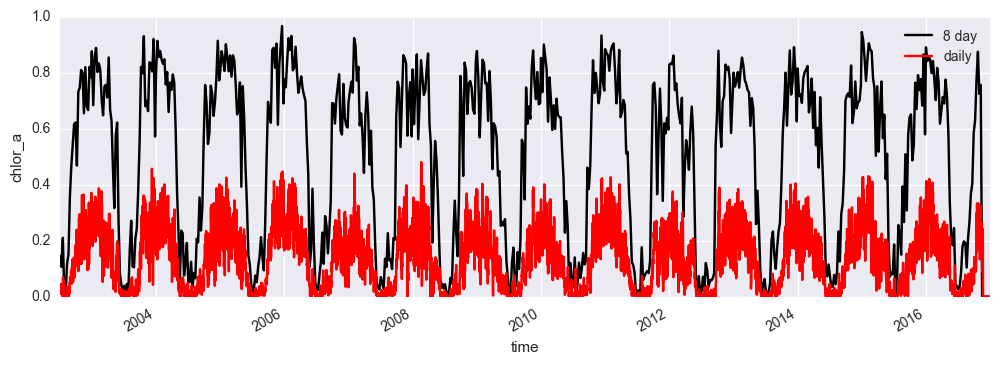

In [33]:
plt.figure(figsize=(12,4))
count_8day.plot(color='k')
count_daily.plot(color='r')

plt.legend(['8 day','daily'])

## Seasonal Climatology

In [34]:
count_8day_clim, coundt_daily_clim = [count.groupby('time.month').mean()  # monthly data
                                      for count in (count_8day, count_daily)]

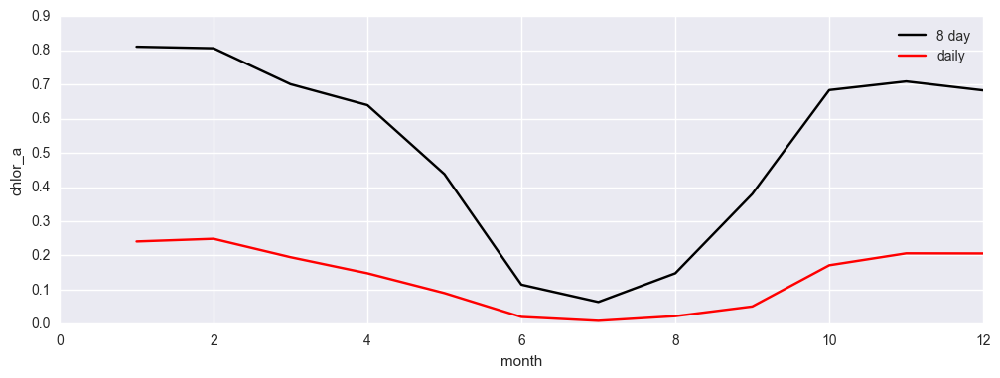

In [35]:
# mean value of the monthly data on the count of nonzeros
plt.figure(figsize=(12,4))
count_8day_clim.plot(color='k')
coundt_daily_clim.plot(color='r')
plt.legend(['8 day', 'daily'])

From the above figure, we see that data coverage is highest in the winter (especially Feburary) and lowest in summer.

## Maps of individual days

Let's grab some data from Febrauary and plot it.

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/colors.py:1022: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


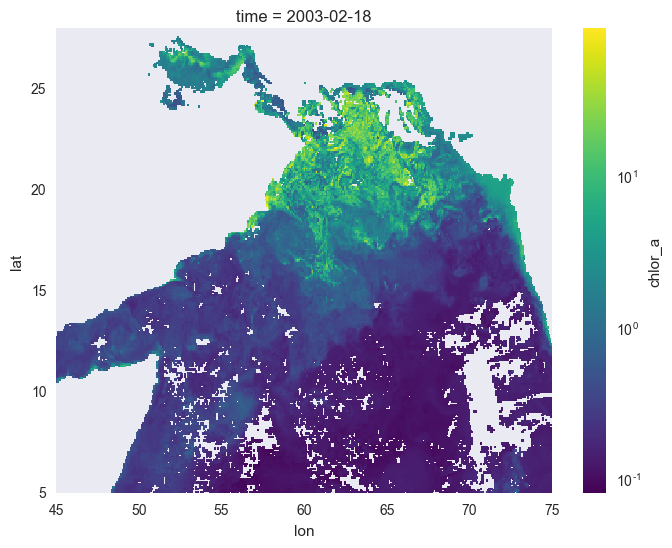

In [36]:
target_date = '2003-02-15'
plt.figure(figsize=(8,6))
ds_8day.chlor_a.sel(time=target_date, method='nearest').plot(norm=LogNorm())

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/colors.py:1022: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


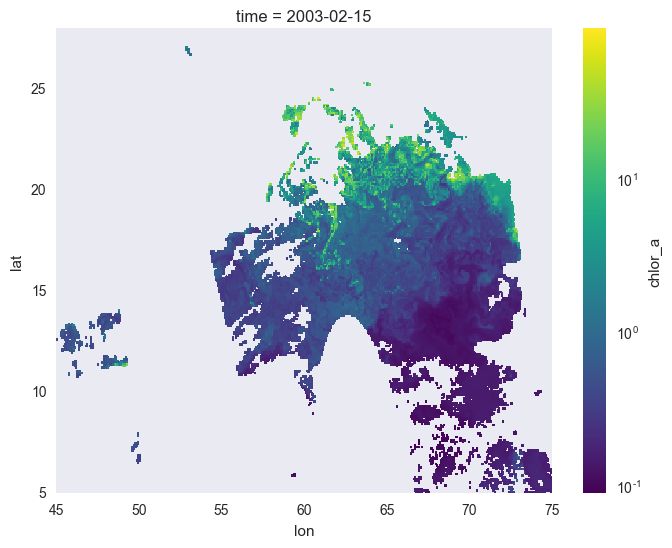

In [37]:
plt.figure(figsize=(8,6))
ds_daily.chlor_a.sel(time=target_date, method='nearest').plot(norm=LogNorm())

In [38]:
ds_daily.chlor_a[0].sel_points(lon=[65, 70], lat=[16, 18], method='nearest')   # the time is selected!
#ds_daily.chl_ocx[0].sel_points(time= times, lon=lons, lat=times, method='nearest')

<xarray.DataArray 'chlor_a' (points: 2)>
array([ nan,  nan])
Coordinates:
    time     datetime64[ns] 2002-07-04
    lon      (points) float64 65.04 70.04
    lat      (points) float64 16.04 18.04
  * points   (points) int64 0 1

In [42]:
df = pd.DataFrame([[1.4, np.nan], [7.1, -4.5], [np.nan, np.nan], [0.75, -1.3]], 
               index=['a', 'b', 'c', 'd'], columns=['one', 'two'])
df.mean(axis=1,skipna=None) # try skipna=False, skipna=True(seems to equiv to skipna=None)

a    1.400
b    1.300
c      NaN
d   -0.275
dtype: float64

In [43]:
ds_9day = ds_daily.resample('9D', dim='time')  # see the above for doc, test case, & default behavior
ds_9day

<xarray.Dataset>
Dimensions:        (eightbitcolor: 256, lat: 276, lon: 360, rgb: 3, time: 589)
Coordinates:
  * lat            (lat) float64 27.96 27.87 27.79 27.71 27.62 27.54 27.46 ...
  * lon            (lon) float64 45.04 45.13 45.21 45.29 45.38 45.46 45.54 ...
  * rgb            (rgb) int64 0 1 2
  * eightbitcolor  (eightbitcolor) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 ...
  * time           (time) datetime64[ns] 2002-07-04 2002-07-13 2002-07-22 ...
Data variables:
    chlor_a        (time, lat, lon) float64 nan nan nan nan nan nan nan nan ...
    palette        (time, rgb, eightbitcolor) float64 -109.0 0.0 108.0 ...

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/matplotlib/colors.py:1022: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


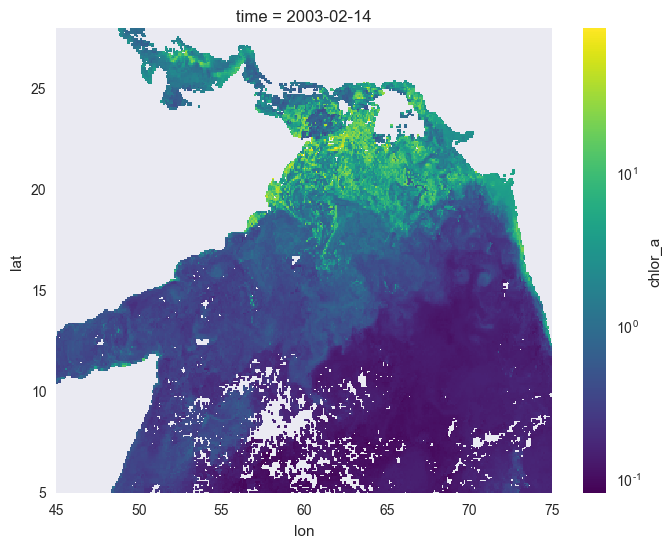

In [44]:
plt.figure(figsize=(8,6))
ds_9day.chlor_a.sel(time=target_date, method='nearest').plot(norm=LogNorm())

In [45]:
# check the range for the longitude
print(ds_9day.lon.min(),'\n' ,ds_9day.lat.min())  

<xarray.DataArray 'lon' ()>
array(45.04166793823242) 
 <xarray.DataArray 'lat' ()>
array(5.041661739349365)


# ++++++++++++++++++++++++++++++++++++++++++++++
# All GDP Floats
# Load the float data
# Map a (time, lon, lat) to a value on the cholorphlly value

In [46]:
# in the following we deal with the data from the gdp float
from buyodata import buoydata
import os

In [47]:
# a list of files
fnamesAll = ['./gdp_float/buoydata_1_5000.dat','./gdp_float/buoydata_5001_10000.dat','./gdp_float/buoydata_10001_15000.dat','./gdp_float/buoydata_15001_jun16.dat']

In [48]:
# read them and cancatenate them into one DataFrame
dfAll = pd.concat([buoydata.read_buoy_data(f) for f in fnamesAll])  # around 4~5 minutes

#mask = df.time>='2002-07-04' # we only have data after this data for chlor_a
dfvvAll = dfAll[dfAll.time>='2002-07-04']

sum(dfvvAll.time<'2002-07-04') # recheck whether the time is 

0

In [49]:
# process the data so that the longitude are all >0
print('before processing, the minimum longitude is%f4.3 and maximum is %f4.3' % (dfvvAll.lon.min(), dfvvAll.lon.max()))
mask = dfvvAll.lon<0
dfvvAll.lon[mask] = dfvvAll.loc[mask].lon + 360
print('after processing, the minimum longitude is %f4.3 and maximum is %f4.3' % (dfvvAll.lon.min(),dfvvAll.lon.max()) )

dfvvAll.describe()

before processing, the minimum longitude is0.0000004.3 and maximum is 360.0000004.3


/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/pandas/core/generic.py:4695: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)
/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2881: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-

after processing, the minimum longitude is 0.0000004.3 and maximum is 360.0000004.3


,id,lat,lon,temp,ve,vn,spd,var_lat,var_lon,var_tmp
count,2.147732e+07,2.131997e+07,2.131997e+07,1.986179e+07,2.129142e+07,2.129142e+07,2.129142e+07,2.147732e+07,2.147732e+07,2.147732e+07
mean,1.765662e+06,-2.263128e+00,2.124412e+02,1.986121e+01,2.454172e-01,4.708192e-01,2.613427e+01,7.326258e+00,7.326555e+00,7.522298e+01
std,9.452835e+06,3.401115e+01,9.746941e+01,8.339498e+00,2.525050e+01,2.052160e+01,1.939087e+01,8.527853e+01,8.527851e+01,2.637454e+02
min,2.578000e+03,-7.764700e+01,0.000000e+00,-1.685000e+01,-2.916220e+02,-2.601400e+02,0.000000e+00,5.268300e-07,-3.941600e-02,1.001300e-03
25%,4.897500e+04,-3.186000e+01,1.490720e+02,1.437300e+01,-1.411400e+01,-1.044700e+01,1.290300e+01,4.366500e-06,7.512600e-06,1.435700e-03
50%,7.141300e+04,-4.920000e+00,2.153940e+02,2.214400e+01,-5.560000e-01,1.970000e-01,2.176700e+01,8.833600e-06,1.495800e-05,1.691700e-03
75%,1.094330e+05,2.756000e+01,3.064370e+02,2.688900e+01,1.356100e+01,1.109300e+01,3.405900e+01,1.833300e-05,3.627900e-05,2.294200e-03
max,6.399288e+07,8.989900e+01,3.600000e+02,4.595000e+01,4.417070e+02,2.783220e+02,4.421750e+02,1.000000e+03,1.000000e+03,1.000000e+03


In [50]:
# Select only the arabian sea region
arabian_sea = (dfvvAll.lon > 45) & (dfvvAll.lon< 75) & (dfvvAll.lat> 5) & (dfvvAll.lat <28)
# arabian_sea = {'lon': slice(45,75), 'lat': slice(5,28)} # later use this longitude and latitude
floatsAll = dfvvAll.loc[arabian_sea]   # directly use mask
print('dfvvAll.shape is %s, floatsAll.shape is %s' % (dfvvAll.shape, floatsAll.shape) )

dfvvAll.shape is (21477317, 11), floatsAll.shape is (111894, 11)


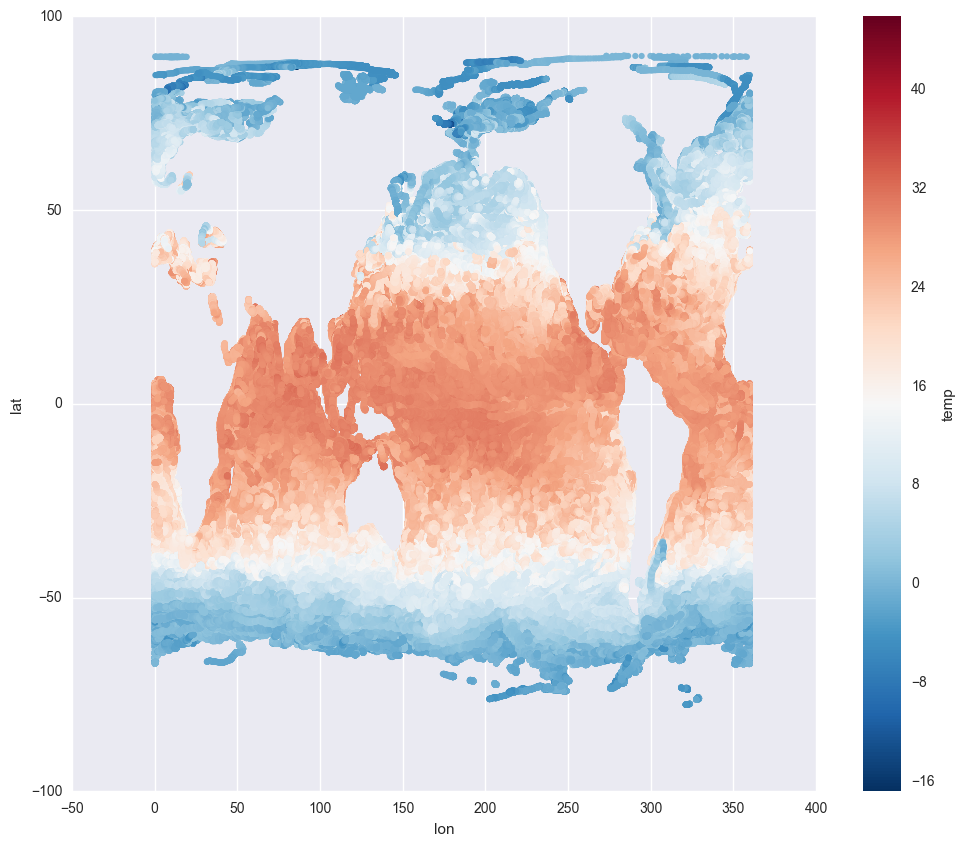

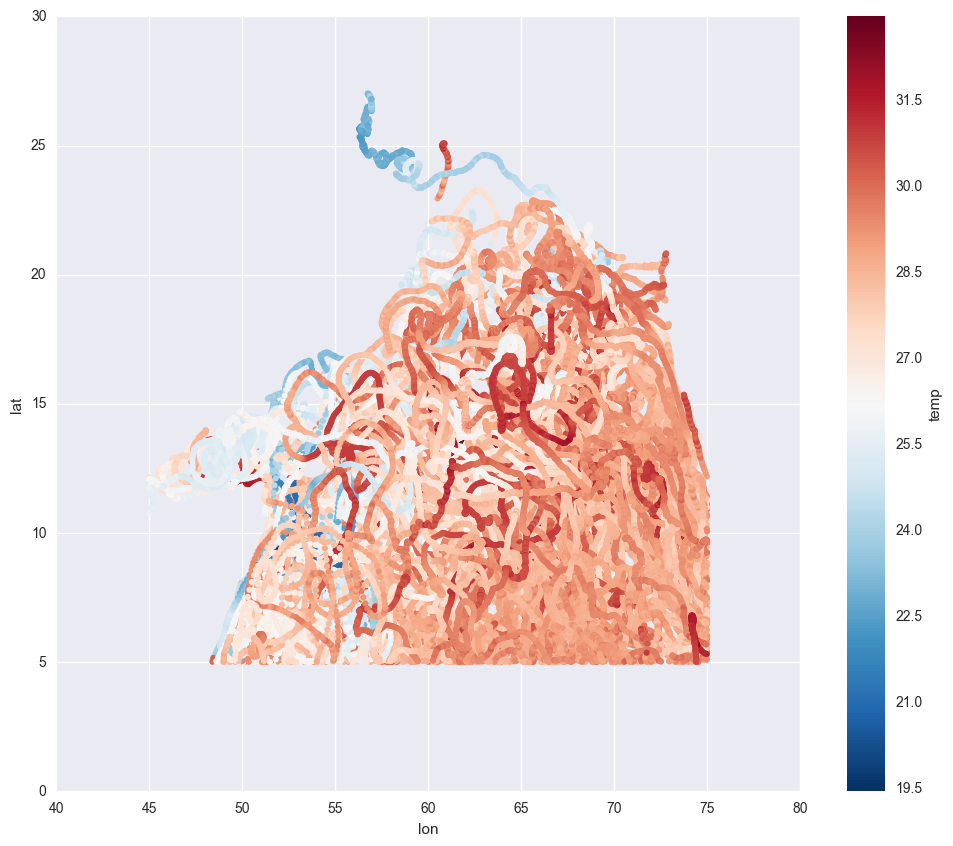

In [51]:
# visualize the float around global region
fig, ax  = plt.subplots(figsize=(12,10))
dfvvAll.plot(kind='scatter', x='lon', y='lat', c='temp', cmap='RdBu_r', edgecolor='none', ax=ax)

# visualize the float around the arabian sea region
fig, ax  = plt.subplots(figsize=(12,10))
floatsAll.plot(kind='scatter', x='lon', y='lat', c='temp', cmap='RdBu_r', edgecolor='none', ax=ax)

In [52]:
# pands dataframe cannot do the resamplingn properly
# cause we are really indexing on ['time','id'], pandas.dataframe.resample cannot do this
# TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'MultiIndex'
print()

In [53]:
# dump the surface floater data from pandas.dataframe to xarray.dataset
floatsDSAll = xr.Dataset.from_dataframe(floatsAll.set_index(['time','id']) ) # set time & id as the index); use reset_index to revert this operation
floatsDSAll

<xarray.Dataset>
Dimensions:  (id: 259, time: 17499)
Coordinates:
  * time     (time) datetime64[ns] 2002-07-04 2002-07-04T06:00:00 ...
  * id       (id) int64 7574 10206 10208 11089 15703 15707 27069 27139 28842 ...
Data variables:
    lat      (time, id) float64 nan 16.3 14.03 16.4 14.04 nan 20.11 nan ...
    lon      (time, id) float64 nan 66.23 69.48 64.58 69.51 nan 68.55 nan ...
    temp     (time, id) float64 nan nan nan 28.0 28.53 nan 28.93 nan 27.81 ...
    ve       (time, id) float64 nan 8.68 5.978 6.286 4.844 nan 32.9 nan ...
    vn       (time, id) float64 nan -13.18 -18.05 -7.791 -17.47 nan 15.81 ...
    spd      (time, id) float64 nan 15.78 19.02 10.01 18.13 nan 36.51 nan ...
    var_lat  (time, id) float64 nan 0.0002661 5.01e-05 5.018e-05 5.024e-05 ...
    var_lon  (time, id) float64 nan 0.0006854 8.851e-05 9.018e-05 8.968e-05 ...
    var_tmp  (time, id) float64 nan 1e+03 1e+03 0.003733 0.0667 nan 0.001683 ...

In [54]:
floatsDSAll.dims

Frozen(SortedKeysDict({'time': 17499, 'id': 259}))

In [55]:
# resample on the xarray.dataset onto two-day frequency
floatsDSAll_9D =floatsDSAll.resample('9D', dim='time')
print(floatsDSAll_9D.dims)   # downsampling on the 'time' dimension 17499/9/4=  around 486
floatsDSAll_9D

Frozen(SortedKeysDict(OrderedDict([('id', 259), ('time', 568)])))


<xarray.Dataset>
Dimensions:  (id: 259, time: 568)
Coordinates:
  * id       (id) int64 7574 10206 10208 11089 15703 15707 27069 27139 28842 ...
  * time     (time) datetime64[ns] 2002-07-04 2002-07-13 2002-07-22 ...
Data variables:
    var_lat  (time, id) float64 nan 0.001326 6.127e-05 6.456e-05 5.404e-05 ...
    vn       (time, id) float64 nan 0.02706 -8.271 -14.36 -7.037 nan -1.798 ...
    temp     (time, id) float64 nan nan nan 27.8 28.57 nan 28.98 nan 27.62 ...
    lon      (time, id) float64 nan 66.53 69.91 65.04 69.92 nan 69.45 nan ...
    lat      (time, id) float64 nan 16.22 13.6 16.07 13.64 nan 20.08 nan ...
    var_tmp  (time, id) float64 nan 1e+03 1e+03 0.00362 0.08884 nan 0.001708 ...
    var_lon  (time, id) float64 nan 0.005002 0.0001159 0.000123 9.882e-05 ...
    ve       (time, id) float64 nan 7.056 12.94 11.14 11.71 nan 24.13 nan ...
    spd      (time, id) float64 nan 8.463 17.92 20.22 16.84 nan 25.5 nan ...

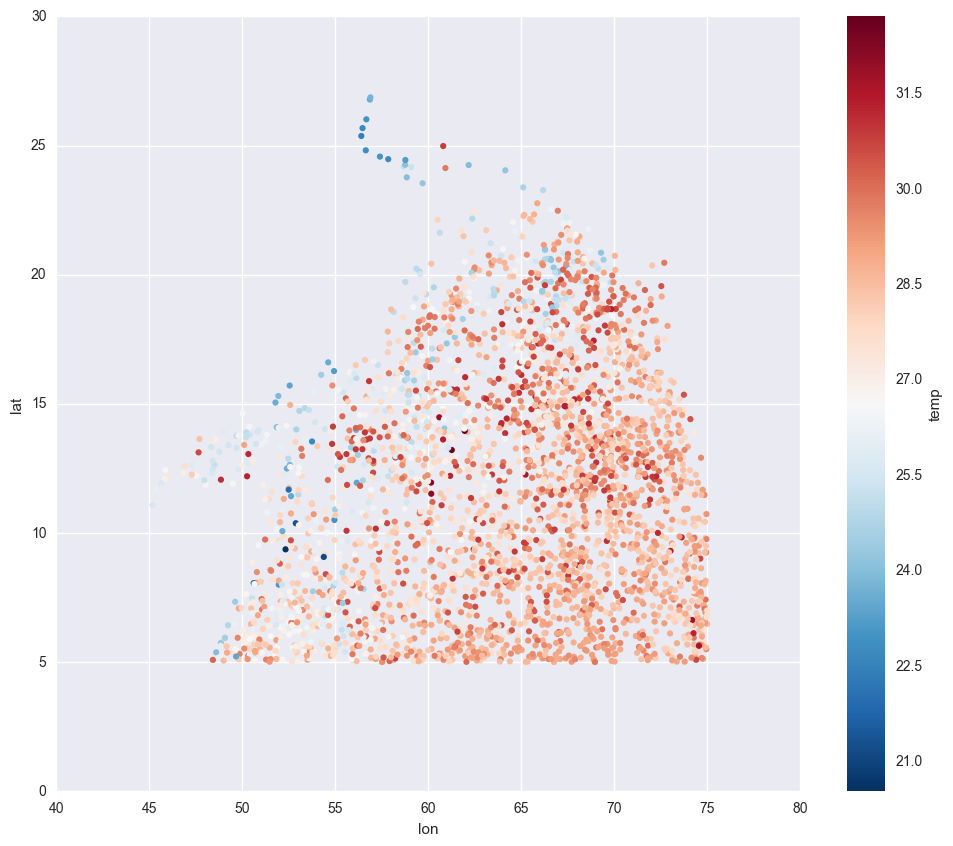

In [56]:
# transfer it back to pandas.dataframe for plotting
floatsDFAll_9D = floatsDSAll_9D.to_dataframe()
floatsDFAll_9D
floatsDFAll_9D = floatsDFAll_9D.reset_index()
floatsDFAll_9D
# visualize the subsamping of floats around arabian region
fig, ax  = plt.subplots(figsize=(12,10))
floatsDFAll_9D.plot(kind='scatter', x='lon', y='lat', c='temp', cmap='RdBu_r', edgecolor='none', ax=ax)

In [57]:
# get the value for the chllorophy for each data entry
floatsDFAll_9Dtimeorder = floatsDFAll_9D.sort_values(['time','id'],ascending=True)
floatsDFAll_9Dtimeorder # check whether it is time ordered!!
# should we drop nan to speed up??

,id,time,var_lat,vn,temp,lon,lat,var_tmp,var_lon,ve,spd
0,7574,2002-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
568,10206,2002-07-04,0.001326,0.027056,NaN,66.533639,16.219000,1000.000000,0.005002,7.056056,8.462583
1136,10208,2002-07-04,0.000061,-8.270944,NaN,69.914139,13.599500,1000.000000,0.000116,12.942722,17.918639
1704,11089,2002-07-04,0.000065,-14.363611,27.796889,65.036972,16.068778,0.003620,0.000123,11.143806,20.217250
2272,15703,2002-07-04,0.000054,-7.037222,28.572750,69.915889,13.637028,0.088844,0.000099,11.706389,16.841889
2840,15707,2002-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3408,27069,2002-07-04,0.000056,-1.797889,28.981389,69.445889,20.077750,0.001708,0.000102,24.130583,25.498500
3976,27139,2002-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4544,28842,2002-07-04,0.000099,-8.122111,27.620472,60.830556,18.624861,0.003344,0.000208,5.026861,18.067944
5112,34159,2002-07-04,0.000059,16.704556,NaN,59.736889,12.894139,1000.000000,0.000112,31.753083,37.039111


In [58]:
'''
<xarray.Dataset>
Dimensions:  (id: 259, time: 568)   # 259*568
'''
floatsDFAll_9Dtimeorder.lon.shape

(147112,)

In [59]:
# can we try to fit the missing value at thisstep
floatsDFAll_9Dtimeorder.lon.dropna().shape  # the longitude data has lots of values (3466,)

(3466,)

In [60]:
# interpolation starts from here

In [61]:
floatsDFAll_9Dtimeorder

,id,time,var_lat,vn,temp,lon,lat,var_tmp,var_lon,ve,spd
0,7574,2002-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
568,10206,2002-07-04,0.001326,0.027056,NaN,66.533639,16.219000,1000.000000,0.005002,7.056056,8.462583
1136,10208,2002-07-04,0.000061,-8.270944,NaN,69.914139,13.599500,1000.000000,0.000116,12.942722,17.918639
1704,11089,2002-07-04,0.000065,-14.363611,27.796889,65.036972,16.068778,0.003620,0.000123,11.143806,20.217250
2272,15703,2002-07-04,0.000054,-7.037222,28.572750,69.915889,13.637028,0.088844,0.000099,11.706389,16.841889
2840,15707,2002-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3408,27069,2002-07-04,0.000056,-1.797889,28.981389,69.445889,20.077750,0.001708,0.000102,24.130583,25.498500
3976,27139,2002-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4544,28842,2002-07-04,0.000099,-8.122111,27.620472,60.830556,18.624861,0.003344,0.000208,5.026861,18.067944
5112,34159,2002-07-04,0.000059,16.704556,NaN,59.736889,12.894139,1000.000000,0.000112,31.753083,37.039111


In [62]:
# has to do task 1 to understand the float data better!!!!!

# task 1: Look into the floatsDFAll_9Dtimeorder data in more details
# check the nan counts in each id
# plot the trajectory of {time, lat, lon, temperature,} for each float id,  
# this steps helps to understand the float dataset and if there is a need, improve it.

# task 2: take the float data as it is, and do the interpolation, whenever there is a nan value use the nearest thing....
# check whether the quality of interpolataion is improved, if not, then have to fall back to to task 1

# task 3: vectorization

In [63]:
# floatsDFAll_9Dtimeorder.set_index(['id','time']) 
# the inverse operation # floatsDFAll_9Dtimeorder.reset_index()

In [64]:
# DataFrame panel data 
# look into the data
floatsDFAll_9Dtimeorder[100:105]
# so far there is no need to convert it into a panel 
# floatsDFAll_9DtimeorderPanel = floatsDFAll_9Dtimeorder.to_panel

,id,time,var_lat,vn,temp,lon,lat,var_tmp,var_lon,ve,spd
56800,62558,2002-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
57368,63036,2002-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
57936,63067,2002-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
58504,63068,2002-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59072,63069,2002-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


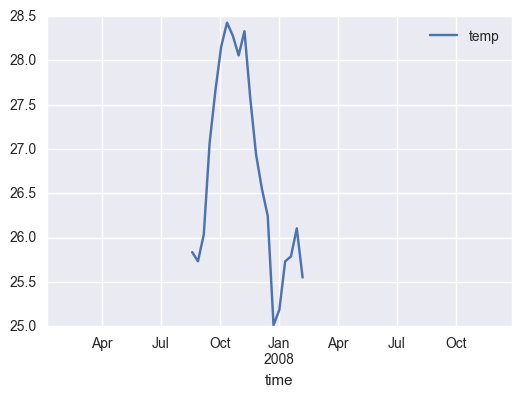

In [65]:
# plot the temperature for one float, the temperature do have a trend
maskid = (floatsDFAll_9Dtimeorder.id == 63069) & (floatsDFAll_9Dtimeorder.time> '2007-01-01') & (floatsDFAll_9Dtimeorder.time< '2009-01-01')
floatsDFAll_9Dtimeorder[maskid]
floatsDFAll_9Dtimeorder[maskid].plot(x='time', y ='temp')

In [66]:
# this is a float that explains the need for temperature data
maskid2 = floatsDFAll_9Dtimeorder.id == 10208
floatsDFAll_9Dtimeorder[maskid2].head()

,id,time,var_lat,vn,temp,lon,lat,var_tmp,var_lon,ve,spd
1136,10208,2002-07-04,0.000061,-8.270944,NaN,69.914139,13.599500,1000.0,0.000116,12.942722,17.918639
1137,10208,2002-07-13,0.000060,-5.433167,NaN,70.726278,13.412417,1000.0,0.000113,8.819778,12.927639
1138,10208,2002-07-22,0.000066,-21.372750,NaN,71.035056,12.617778,1000.0,0.000127,-1.535306,25.644722
1139,10208,2002-07-31,0.000069,-31.578528,NaN,70.913944,10.364833,1000.0,0.000135,1.551611,32.618917
1140,10208,2002-08-09,0.000065,-7.338472,NaN,71.453528,9.144639,1000.0,0.000125,12.855500,15.766083


In [67]:
list(floatsDFAll_9Dtimeorder.time)[:5]

[Timestamp('2002-07-04 00:00:00'),
 Timestamp('2002-07-04 00:00:00'),
 Timestamp('2002-07-04 00:00:00'),
 Timestamp('2002-07-04 00:00:00'),
 Timestamp('2002-07-04 00:00:00')]

In [68]:
floatsDFAll_9Dtimeorder.time[:5]

0      2002-07-04
568    2002-07-04
1136   2002-07-04
1704   2002-07-04
2272   2002-07-04
Name: time, dtype: datetime64[ns]

In [69]:
ds_9day

<xarray.Dataset>
Dimensions:        (eightbitcolor: 256, lat: 276, lon: 360, rgb: 3, time: 589)
Coordinates:
  * lat            (lat) float64 27.96 27.87 27.79 27.71 27.62 27.54 27.46 ...
  * lon            (lon) float64 45.04 45.13 45.21 45.29 45.38 45.46 45.54 ...
  * rgb            (rgb) int64 0 1 2
  * eightbitcolor  (eightbitcolor) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 ...
  * time           (time) datetime64[ns] 2002-07-04 2002-07-13 2002-07-22 ...
Data variables:
    chlor_a        (time, lat, lon) float64 nan nan nan nan nan nan nan nan ...
    palette        (time, rgb, eightbitcolor) float64 -109.0 0.0 108.0 ...

In [434]:
a = [0,1,2,3,4,5,5,5,5]
a[5] = 4
for i in range(0,len(a)):
    if a[i] == 5:
        a[i]=4


TypeError: list indices must be integers or slices, not tuple

In [70]:
idx_time = ds_9day.indexes['time']
idx_lat = ds_9day.indexes['lat']
idx_lon = ds_9day.indexes['lon']


### 'time is from small to big number'
print(ds_9day.indexes['time'])
print(type(ds_9day.indexes['time']))

### 'lat is from *big* to small number'
print(ds_9day.indexes['lat'])
print(type(ds_9day.indexes['lat']))

### 'lon is from small to big number'
print(ds_9day.indexes['lon'])
print(type(ds_9day.indexes['lon']))

# validation: to locate the chl-a for this point {time:2002-07-13, lat:27.7916660309, lon:45.2916679382}

DatetimeIndex(['2002-07-04', '2002-07-13', '2002-07-22', '2002-07-31',
               '2002-08-09', '2002-08-18', '2002-08-27', '2002-09-05',
               '2002-09-14', '2002-09-23',
               ...
               '2016-10-09', '2016-10-18', '2016-10-27', '2016-11-05',
               '2016-11-14', '2016-11-23', '2016-12-02', '2016-12-11',
               '2016-12-20', '2016-12-29'],
              dtype='datetime64[ns]', name='time', length=589, freq='9D')
<class 'pandas.tseries.index.DatetimeIndex'>
Float64Index([27.9583339691, 27.8749980927, 27.7916660309, 27.7083339691,
              27.6249980927, 27.5416660309, 27.4583339691, 27.3749980927,
              27.2916660309, 27.2083339691,
              ...
              5.79166173935, 5.70833349228, 5.62499761581, 5.54166173935,
              5.45833349228, 5.37499761581, 5.29166173935, 5.20833349228,
              5.12499761581, 5.04166173935],
             dtype='float64', name='lat', length=276)
<class 'pandas.indexes.numeric.Flo

In [ ]:
# do the interpolation for one point above

In [ ]:
#for row in floatsDFAll_9Dtimeorder.itertuples():
    #print('row.time = %s, row.id=%d, row.lon=%4.3f, row.lat=%4.3f' % (row.time,row.id,row.lon,row.lat)  )
    # now just focus on this entry:
    # row.time = 2002-07-04 00:00:00, row.id=10206, row.lon=66.534, row.lat=16.219, do interpolation

In [73]:
# simulate the api for one entry in the float data
# generate test points
# test case 1: a single entry (southeast corner for valid values)
row_case1 =  pd.DataFrame(data = {'time':'2002-07-13 00:00:00', 'id': 10206, 'lon':74.7083358765, 'lat':5.20833349228},index=[1])
# test case 2: a list of entries, API for DS
row_case2 =  pd.DataFrame(data = {'time':['2002-07-13 00:00:00','2002-07-22 00:00:00'] , 'id': [10206, 10206], 'lon':[74.7083358765, 74.6250076294], 'lat':[5.20833349228, 5.29166173935]},index=[2,3])

print(row_case1.time)
print('-----')
print('row_case1', row_case1)
print('row_case2', row_case2)
print('-----')
print(type(row_case1.time))
print('-----')
print(pd.DatetimeIndex(row_case1.time))
#idx_time.get_loc

1    2002-07-13 00:00:00
Name: time, dtype: object
-----
row_case1       id       lat        lon                 time
1  10206  5.208333  74.708336  2002-07-13 00:00:00
row_case2       id       lat        lon                 time
2  10206  5.208333  74.708336  2002-07-13 00:00:00
3  10206  5.291662  74.625008  2002-07-22 00:00:00
-----
<class 'pandas.core.series.Series'>
-----
DatetimeIndex(['2002-07-13'], dtype='datetime64[ns]', name='time', freq=None)


In [74]:
### np.datetime64 support arithmics on date
### an example
dt64 = np.datetime64('2012-05-01') 
dt64
dt65 = np.datetime64('2013-02-02') 
dt65
difference = dt65 - dt64 
#difference.day
print(type(difference))
print(difference)

# in different units
print('difference in days:',  difference / np.timedelta64(1, 'D') )
print('difference in hours:',  difference / np.timedelta64(1, 'h') )
print('difference in mintes:',  difference / np.timedelta64(1, 'm') )
print('difference in second:',  difference / np.timedelta64(1, 's') )
print('difference in millisecond:',  difference / np.timedelta64(1, 'ms') )

<class 'numpy.timedelta64'>
277 days
difference in days: 277.0
difference in hours: 6648.0
difference in mintes: 398880.0
difference in second: 23932800.0
difference in millisecond: 23932800000.0


In [75]:
# delete the comment: 
# find the nearest idices(values) alaong each direction,
# find the next indices(values) along each direction,
# find the delta along each direction,
# carry out the multipliear interpolations

In [76]:
################
# test case 1: take a single entry (southeast corner for valid values)
row_case1 =  pd.DataFrame(data = {'time':'2002-07-13 00:00:00', 'id': 10206, 'lon':74.7083358765, 'lat':5.20833349228},index=[1])
print(row_case1)

      id       lat        lon                 time
1  10206  5.208333  74.708336  2002-07-13 00:00:00


In [77]:
### interpolation on the time dimension
xtime_test = np.datetime64(row_case1.time.values[0])  # for delta 
itime_nearest = idx_time.get_loc(xtime_test, method='nearest')
# itime_nearest # 1

xtime_nearest =  ds_9day.time[itime_nearest].values  # 2002-07-13T00:00:00.000000000
print('xtime_nearest', xtime_nearest)
print('xtime_nearest', type(xtime_nearest)) # xtime_nearest <class 'numpy.datetime64'>

# the time distance in days
delta_xtime = (xtime_test - xtime_nearest) / np.timedelta64(1, 'D')
print('delta_xtime in days', delta_xtime)

if delta_xtime >=0: # the nearest index is on the left
    itime_next = itime_nearest + 1 # increase the location of the index (or coordinates)
else:              # the nearest index is on the right
    itime_next = itime_nearest -1

# find the next coordinate values
xtime_next = ds_9day.time[itime_next].values
print('xtime_next', xtime_next)


# prepare for the Tri-linear interpolation
base_time = (xtime_next - xtime_nearest) / np.timedelta64(1, 'D')
print('base_time', base_time)
w_time = delta_xtime / base_time  
print('w_time', w_time) # 0.0

xtime_nearest 2002-07-13T00:00:00.000000000
xtime_nearest <class 'numpy.datetime64'>
delta_xtime in days 0.0
xtime_next 2002-07-22T00:00:00.000000000
base_time 9.0
w_time 0.0


In [78]:
### interpolation on the lat dimension
xlat_test = row_case1.lat.values[0] + 0.06  # base 5.20833349228 # cell distance around .8, use .2 & .6 as two tests
ilat_nearest = idx_lat.get_loc(xlat_test, method='nearest')
print(ilat_nearest) # 272

xlat_nearest = ds_9day.lat[ilat_nearest].values  
print('xlat_nearest', xlat_nearest)

delta_xlat = xlat_test - xlat_nearest
print("delta_xlat",delta_xlat)

if delta_xlat >=0 : # the nearest index is on the right; but order of the latitude is different, it is descending
    ilat_next = ilat_nearest-1 # caution about the order, it is an inverse order
else:
    ilat_next = ilat_nearest+1

# find the next coordinates value
print(ilat_next)   # 273
xlat_next = ds_9day.lat[ilat_next].values
print('xlat_next', xlat_next)

# prepare for the Tri-linear interpolation
w_lat = delta_xlat / (xlat_next - xlat_nearest)
print('w_lat', w_lat) # 0.279956051994

272
xlat_nearest 5.291661739349365
delta_xlat -0.0233282470694
273
xlat_next 5.208333492279053
w_lat 0.279956051994


In [79]:
### interpolation on the lon dimension
xlon_test = row_case1.lon.values[0] +0.06 # base 74.7083358765 # cell distance around .8, use .2 & .6 as two tests
ilon_nearest =  idx_lon.get_loc(xlon_test, method = 'nearest')
print(ilon_nearest) # 357

xlon_nearest = ds_9day.lon[ilon_nearest].values  
print('xlon_nearest', xlon_nearest)

delta_xlon = xlon_test - xlon_nearest
print("delta_xlat", delta_xlon)

if delta_xlon >=0: # the nearest index is on the left
    ilon_next = ilon_nearest +1 # increase the location of the index (or coordinates)
else:
    ilon_next = ilon_nearest -1
    
print(ilon_next) # 356
    
# find the next coordinate values
xlon_next = ds_9day.lon[ilon_next].values
print("xlon_next", xlon_next)

# prepare for the Tri-linear interpolation
w_lon = delta_xlon / (xlon_next - xlon_nearest)
print("w_lon", w_lon) # 0.279956051583

357
xlon_nearest 74.79166412353516
delta_xlat -0.0233282470352
356
xlon_next 74.70833587646484
w_lon 0.279956051583


In [80]:
'''
### Pseudocode for Trilinear interpolation
# 1D
w = delta_x / (x_next -x_nearest)
f = (1-w)*da.isel(x=ix_nearest).values + w* da.isel(x=ix_next).values

# 2D
wx = delta_x / (x_next - x_nearest)
wy = delta_y / (y_next - y_nearest)
f = (1-wx)*(1-wy)*da.isel(x=ix_nearest, y=iy_nearest).values + 
        (1-wx)*wy*da.isel(x=ix_nearest,y=iy_next).values     +
        wx*(1-wy)*da.isel(x=ix_next,y=iy_nearest).values     +
            wx*wy*da.isel(x=ix_next,y=iy_next).values
            
# 3D
wx = delta_x / (x_next - x_nearest)
wy = delta_y / (y_next - y_nearest)
wz = delta_z / (z_next - z_nearest)
f = (1-wx)*(1-wy)*(1-wz)*da.isel(x=ix_nearest, y=iy_nearest, z=iz_nearest).values  + 
        (1-wx)*(1-wy)*wz*da.isel(x=ix_nearest, y=iy_nearest, z=iz_next).values     +
        (1-wx)*wy*(1-wz)*da.isel(x=ix_nearest, y=iy_next, z=iz_nearest).values     +
            (1-wx)*wy*wz*da.isel(x=ix_nearest, y=iy_next, z=iz_next).values        +
        wx*(1-wy)*(1-wz)*da.isel(x=ix_next, y=iy_nearest, z=iz_nearest).values     +
            wx*(1-wy)*wz*da.isel(x=ix_next, y=iy_nearest, z=iz_next).values        +
            wx*wy*(1-wz)*da.isel(x=ix_next, y=iy_next, z=iz_nearest).values        +
                wx*wy*wz*da.isel(x=ix_next, y=iy_next, z=iz_next).values     
'''

'''
### interpolate the Trilinear Value
dimensions 3 : time, lat, lon
locations: xtime_test, xlat_test, xlon_test
weights(from the nearest coordinates): w_time, w_lat, w_lon
output: a singel value based on 1D interpolation on each dimension, so use 8-neighbours
'''

# validate this 
# try two pints as a list to check the interface
#ds_9day.chlor_a.sel_points(time=list(floatsDFAll_9Dtimeorder.time),lon=list(floatsDFAll_9Dtimeorder.lon), lat=list(floatsDFAll_9Dtimeorder.lat), method='nearest')


# preprocessing for nan values for each dimension
# dim:time
#print(ds_9day.chlor_a.isel_points(time=list([itime_nearest]), lat=list([ilat_nearest]), lon=list([ilon_nearest])).values)


# caution: nan values, store as "list_of_array to 2d_array" first, then sum
tmp = np.array([
         ds_9day.chlor_a.isel_points(time=list([itime_nearest]), lat=list([ilat_nearest]), lon=list([ilon_nearest])).values,
         ds_9day.chlor_a.isel_points(time=list([itime_nearest]), lat=list([ilat_nearest]), lon=list([ilon_next])).values,
         ds_9day.chlor_a.isel_points(time=list([itime_nearest]), lat=list([ilat_next]), lon=list([ilon_nearest])).values,
         ds_9day.chlor_a.isel_points(time=list([itime_nearest]), lat=list([ilat_next]), lon=list([ilon_next])).values,
         ds_9day.chlor_a.isel_points(time=list([itime_next]), lat=list([ilat_nearest]), lon=list([ilon_nearest])).values,
         ds_9day.chlor_a.isel_points(time=list([itime_next]), lat=list([ilat_nearest]), lon=list([ilon_next])).values,
         ds_9day.chlor_a.isel_points(time=list([itime_next]), lat=list([ilat_next]), lon=list([ilon_nearest])).values,
         ds_9day.chlor_a.isel_points(time=list([itime_next]), lat=list([ilat_next]), lon=list([ilon_next])).values ])


weights =  np.array([(1-w_time)*(1-w_lat)*(1-w_lon), 
                     (1-w_time)*(1-w_lat)*w_lon,
                     (1-w_time)*w_lat*(1-w_lon), 
                     (1-w_time)*w_lat*w_lon,
                        w_time*(1-w_lat)*(1-w_lon),
                        w_time*(1-w_lat)*w_lon,
                        w_time*w_lat*(1-w_lon),
                        w_time*w_lat*w_lon ])


# how to deal with "nan" values, fill in missing values for the np.array tmpAll 
# or fill the mean values to the unweighted array
# http://stackoverflow.com/questions/18689235/numpy-array-replace-nan-values-with-average-of-columns

print('\n neighbouring tensor used', tmp)

# column min: (nan+0.245878 + nan + nan + 0.19680101 + nan +  nan + 0.18532801)/8 = 0.20933567333
col_mean = np.nanmean(tmp, axis=0)
print('its mean along axis 0(column) \n', col_mean)  

# filling the missing values.
inds = np.where(np.isnan(tmp))
print('\n nan index\n', inds)
tmp[inds]=np.take(col_mean, inds[1])
print('\n values after the fill \n', tmp)

print('\n weighting tensor used \n', weights)

print('\n tensor product\n', np.dot(weights, tmp)) # [ 0.2167019]

# validate by 1D array
# val = np.array([0.20933567, 0.245878,  0.20933567,
#                0.20933567, 0.19680101, 0.20933567,
#               0.20933567,0.18532801]) 
# np.dot(val, weights) # 0.21670189702309739


 neighbouring tensor used [[        nan]
 [ 0.245878  ]
 [        nan]
 [        nan]
 [ 0.19680101]
 [        nan]
 [        nan]
 [ 0.18532801]]
its mean along axis 0(column) 
 [ 0.20933567]

 nan index
 (array([0, 2, 3, 5, 6]), array([0, 0, 0, 0, 0]))

 values after the fill 
 [[ 0.20933567]
 [ 0.245878  ]
 [ 0.20933567]
 [ 0.20933567]
 [ 0.19680101]
 [ 0.20933567]
 [ 0.20933567]
 [ 0.18532801]]

 weighting tensor used 
 [ 0.51846329  0.20158066  0.20158066  0.07837539  0.          0.          0.
  0.        ]

 tensor product
 [ 0.2167019]


In [81]:
ilon_nearest

357

In [263]:
################
# test case 2
# take a {time-list, id-list, lon-list, lat-list}, index-list 
# carry out the interpolation
#row_case2 =  pd.DataFrame(data = {'time':['2002-07-13 00:00:00','2002-07-22 00:00:00'] , 'id': [10206, 10206], 'lon':[74.7083358765, 74.6250076294], 'lat':[5.20833349228, 5.29166173935]},index=[2,3])
#print(row_case2)
################
# test case 3
row_case2 =  pd.DataFrame(data = {'time':['2002-07-13 00:00:00', '2002-07-22 00:00:00', '2002-07-13 00:00:00'] , 'id': [10206, 10206, 10206], 'lon':[74.7083358765, 74.6250076294,74.7083358765], 'lat':[5.20833349228, 5.29166173935, 5.20833349228]},index=[1,2,3])
print(row_case2)


#### 
#interpolation on the time dimension
time_len = len(row_case2.time.values)
xtime_test = list([ np.datetime64(row_case2.time.values[i]) for i in range(0,time_len)  ] )  # for delta 
print('\n xtime_test \n', xtime_test)

'''caution: cannot do this inside the function get_loc,
see https://github.com/pandas-dev/pandas/issues/3488
'''
itime_nearest = [idx_time.get_loc(xtime_test[i], method='nearest') for i in range(0, time_len)]
print('\n itime_nearest \n', itime_nearest)  # [1,2]

xtime_nearest =  ds_9day.time[itime_nearest].values  #  ['2002-07-13T00:00:00.000000000' '2002-07-22T00:00:00.000000000']
print('\n xtime_nearest\n', xtime_nearest)  # ['2002-07-13T00:00:00.000000000' '2002-07-22T00:00:00.000000000']
print('xtime_nearest', type(xtime_nearest)) # xtime_nearest <class 'numpy.ndarray'> # time_nearest <class 'numpy.datetime64'>

# the time distance in days
delta_xtime = (xtime_test - xtime_nearest) / np.timedelta64(1, 'D')
print('\n delta_xtime in days \n', delta_xtime)
print(type(delta_xtime))

itime_next = [itime_nearest[i]+1 if  delta_xtime[i] >=0  else itime_nearest[i]-1  for i in range(0, time_len) ]
print('\n itime_next \n',itime_next)  # [2, 3]

# find the next coordinate values
xtime_next = ds_9day.time[itime_next].values
print('\n xtime_next \n', xtime_next) # ['2002-07-22T00:00:00.000000000' '2002-07-31T00:00:00.000000000']

# prepare for the Tri-linear interpolation
base_time = (xtime_next - xtime_nearest) / np.timedelta64(1, 'D')  # [ 9.  9.]
print('\n base_time \n', base_time)
w_time = delta_xtime / base_time  
print('\n w_time \n', w_time) # [ 0.  0.]


#### 
#interpolation on the lat dimension
xlat_test = row_case2.lat.values + 0.06   # base [ 5.20833349  5.29166174] # cell distance around .8, use .2 & .6 as two tests
print('\n xlat_test \n', xlat_test)       # xlat_test [ 5.26833349  5.35166174]

ilat_nearest = [idx_lat.get_loc(xlat_test[i], method='nearest') for i in range(0, time_len)]
print('\n ilat_nearest \n', ilat_nearest) # [272, 271]

xlat_nearest = ds_9day.lat[ilat_nearest].values  
print('\n xlat_nearest \n', xlat_nearest) # [ 5.29166174  5.37499762]

delta_xlat = xlat_test - xlat_nearest
print("\n delta_xlat \n",delta_xlat)      #  [-0.02332825 -0.02333588]


# the nearest index is on the right; but order of the latitude is different, it is descending
ilat_next = [ilat_nearest[i]-1 if  delta_xlat[i] >=0  else ilat_nearest[i]+1  for i in range(0, time_len) ]
print('\n ilat_next \n', ilat_next)  # [273, 272]

# find the next coordinates value
xlat_next = ds_9day.lat[ilat_next].values
print('\n xlat_next \n', xlat_next)  # [ 5.20833349  5.29166174]

# prepare for the Tri-linear interpolation
w_lat = delta_xlat / (xlat_next - xlat_nearest)
print('\n w_lat \n', w_lat) # [ 0.27995605  0.28002197]

#### 
#interpolation on the lon dimension
xlon_test = row_case2.lon.values +0.06 # base [74.7083358765, 74.6250076294] # cell distance around .8, use .2 & .6 as two tests
print('\n xlon_test \n', xlon_test)  # [ 74.76833588  74.68500763]

ilon_nearest = [idx_lon.get_loc(xlon_test[i], method='nearest') for i in range(0, time_len)]
print('\n ilon_nearest \n', ilon_nearest) # [357, 356]

xlon_nearest = ds_9day.lon[ilon_nearest].values  
print('\n xlon_nearest \n', xlon_nearest) # [ 74.79166412  74.70833588]

delta_xlon = xlon_test - xlon_nearest     
print("\n delta_xlon \n", delta_xlon)     #  [-0.02332825 -0.02332825]

ilon_next = [ilon_nearest[i]+1 if  delta_xlon[i] >=0  else ilon_nearest[i]-1  for i in range(0, time_len) ]
print('\n ilon_next \n',ilon_next)  # [356, 355]

# find the next coordinate values
xlon_next = ds_9day.lon[ilon_next].values
print("\n xlon_next \n", xlon_next) # [ 74.70833588  74.62500763]

# prepare for the Tri-linear interpolation
w_lon = delta_xlon / (xlon_next - xlon_nearest)
print("\n w_lon \n", w_lon) # [ 0.27995605  0.27995605]

####
# local Tensor product for Trilinear interpolation
# caution: nan values, store as "list_of_array to 2d_array" first, then sum

# no casting to list needed here, inputs are already lists
tmp = np.array([
         ds_9day.chlor_a.isel_points(time=itime_nearest, lat=ilat_nearest, lon=ilon_nearest).values,
         ds_9day.chlor_a.isel_points(time=itime_nearest, lat=ilat_nearest, lon=ilon_next).values,
         ds_9day.chlor_a.isel_points(time=itime_nearest, lat=ilat_next, lon=ilon_nearest).values,
         ds_9day.chlor_a.isel_points(time=itime_nearest, lat=ilat_next, lon=ilon_next).values,
         ds_9day.chlor_a.isel_points(time=itime_next, lat=ilat_nearest, lon=ilon_nearest).values,
         ds_9day.chlor_a.isel_points(time=itime_next, lat=ilat_nearest, lon=ilon_next).values,
         ds_9day.chlor_a.isel_points(time=itime_next, lat=ilat_next, lon=ilon_nearest).values,
         ds_9day.chlor_a.isel_points(time=itime_next, lat=ilat_next, lon=ilon_next).values ])

weights =  np.array([(1-w_time)*(1-w_lat)*(1-w_lon), 
                     (1-w_time)*(1-w_lat)*w_lon,
                     (1-w_time)*w_lat*(1-w_lon), 
                     (1-w_time)*w_lat*w_lon,
                        w_time*(1-w_lat)*(1-w_lon),
                        w_time*(1-w_lat)*w_lon,
                        w_time*w_lat*(1-w_lon),
                        w_time*w_lat*w_lon ])


# how to deal with "nan" values, fill in missing values for the np.array tmpAll 
# or fill the mean values to the unweighted array
# http://stackoverflow.com/questions/18689235/numpy-array-replace-nan-values-with-average-of-columns

print('\n neighbouring tensor used \n', tmp)
'''
 neighbouring tensor used 
 [[        nan  0.181841  ]
 [ 0.245878           nan]
 [        nan         nan]
 [        nan         nan]
 [ 0.19680101         nan]
 [        nan         nan]
 [        nan         nan]
 [ 0.18532801         nan]]
'''

# column min: (nan+0.245878 + nan + nan + 0.19680101 + nan +  nan + 0.18532801)/8 = 0.20933567333
col_mean = np.nanmean(tmp, axis=0)
print('\n its mean along axis 0(column) \n', col_mean)  #  [ 0.20933567  0.181841  ]


# filling the missing values.
inds = np.where(np.isnan(tmp))
print('\n nan index\n', inds)
tmp[inds]=np.take(col_mean, inds[1])
print('\n values after the fill \n', tmp)

print('\n weighting tensor used \n', weights)

print("weights.shape", weights.shape) # (8, 3)
print("tmp.shape", tmp.shape)  # (8, 3)

nrow_w, ncol_w = weights.shape
nrow_t, ncol_t = tmp.shape
assert nrow_w == nrow_t, "the row count of weights and values are not the same!"
assert ncol_w == ncol_t, "the row count of weights and values are not the same!"
print('\n tensor product\n', np.dot(weights[:,0], tmp[:,0]) ) # 0.216701896135 should be [ 0.2167019]

# new interpolation process of the Chl_a
chl_new = np.empty(ncol_w)
for i in range(0, ncol_w, 1):
    chl_new[i] =  np.dot(weights[:,i], tmp[:,i])

print('chl_newInt',  chl_new) #  [ 0.2167019  0.181841   0.2167019]
# validate by 1D array
# val = np.array([0.20933567, 0.245878,  0.20933567,
#                0.20933567, 0.19680101, 0.20933567,
#               0.20933567,0.18532801]) 
# np.dot(val, weights) # 0.21670189702309739


## output xarray.dataarray of points, see examples below
# this is the way how xarray.Dataset works
# if you want a xarray.DataArray, first generate a xarray.Dataset, then select DataArray from there.
chl_newInt = xr.Dataset({'chl': (['id'], np.random.randn(3))},
                        coords={
                                'time':(['points'],['2002-07-13 00:00:00', '2002-07-22 00:00:00', '2002-07-13 00:00:00']) , \
                                'id': (['points'], [10206, 10206, 10206]), 
                                'lon': (['points'], [74.7083358765, 74.6250076294,74.7083358765]),
                                'lat':(['points'], [5.20833349228, 5.29166173935, 5.20833349228]), 
                                'points': (['points'], [0,1,2])}) # this way the dims is set to point

print('\n',chl_newInt.chl)
'''
### Task: output xarray.dataarray as points
## example 1
arr = xr.DataArray(np.random.rand(4,3), [('time', pd.date_range('2000-01-01', periods=4)), ('space', ['IA', 'IL', 'IN'])] )
print("first example",arr)
print("\n \n")

## example2 -- concrete xr.DataArray
data = np.random.rand(4, 3)
locs = ['IA', 'IL', 'IN']
times = pd.date_range('2000-01-01', periods=4)
brr = xr.DataArray(data, coords={'time': times, 'space': locs, 'const': 42, \
                          'ranking': ('space', [1, 2, 3])}, \
             dims=['time', 'space'])
print("second example",brr)
'''

'''
### the target output
#the output generated by the xarray.DataSet => xarray.DataArray
<xarray.DataArray 'chlor_a' (points: 147112)>
array([ nan,  nan,  nan, ...,  nan,  nan,  nan])
Coordinates:
    time     (points) datetime64[ns] 2002-07-04 2002-07-04 2002-07-04 ...
    lon      (points) float64 74.96 66.54 69.88 65.04 69.88 74.96 69.46 ...
    lat      (points) float64 27.96 16.21 13.62 16.04 13.62 27.96 20.04 ...
  * points   (points) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  
### the solution approach we tried to is: first,  generate a xarray.DataSet
                                          second, generte a xarray.DataArray from the xarray DataSet if needed.
 
# 1. looking at this example, DataArray seems to be working.

# works here
da_test1 = xr.DataArray(np.random.rand(3), dims=['x'],
                        coords={'x': np.array([10206, 10206, 10206]), 'y':  2} )
print('\n da_test1', da_test1)

##########
# but not works here
da_test1 = xr.DataArray(np.random.rand(3), dims=['x'],
                        coords={'x': np.array([10206, 10206, 10206]), 'y':  np.array([10206, 10206, 10206])} )
print('\n da_test1', da_test1)

# err's
##########

##########
# works here
da_test1 = xr.DataArray(np.random.rand(3), dims=['x'],
                        coords={'x': np.array([10206, 10206, 10206]), 'y':  2} )
print('\n da_test1', da_test1)

# da_test1 <xarray.DataArray (x: 3)>
# array([ 0.90386212,  0.21516239,  0.44707272])
# Coordinates:
#   * x        (x) int64 10206 10206 10206
#     y        int64 2
##########

##########
# so we do this
# this is the way how xarray.Dataset works
# if you want a xarray.DataArray, first generate a xarray.Dataset, then select DataArray from there.
chl_newInt = xr.Dataset({'chl': (['id'], np.random.randn(3))},
                        coords={ 
                           'id':  (['id'], np.array([10206, 10206, 10206])), 
                           'lon': (['id'], np.array([74.7083358765, 74.6250076294,74.7083358765])), 
                           'lat': (['id'], np.array([5.20833349228, 5.29166173935, 5.20833349228]))})
print('chl_newInt', chl_newInt) # generate the xarray.DataSet
print('\n \n')
print('chl_newInt.chl', chl_newInt.chl) # xarray.DataSet contains many xarray.DataArray


#chl_newInt <xarray.Dataset>
#Dimensions:  (id: 3)
#Coordinates:
#    lon      (id) float64 74.71 74.63 74.71
#  * id       (id) int64 10206 10206 10206
#    lat      (id) float64 5.208 5.292 5.208
#Data variables:
#    chl      (id) float64 0.783 -0.9714 -0.3206



#chl_newInt.chl <xarray.DataArray 'chl' (id: 3)>
#array([ 0.78301614, -0.97144208, -0.3206447 ])
#Coordinates:
#    lon      (id) float64 74.71 74.63 74.71
#  * id       (id) int64 10206 10206 10206
#    lat      (id) float64 5.208 5.292 5.208

'''
print()

      id       lat        lon                 time
1  10206  5.208333  74.708336  2002-07-13 00:00:00
2  10206  5.291662  74.625008  2002-07-22 00:00:00
3  10206  5.208333  74.708336  2002-07-13 00:00:00

 xtime_test 
 [numpy.datetime64('2002-07-13T00:00:00'), numpy.datetime64('2002-07-22T00:00:00'), numpy.datetime64('2002-07-13T00:00:00')]

 itime_nearest 
 [1, 2, 1]

 xtime_nearest
 ['2002-07-13T00:00:00.000000000' '2002-07-22T00:00:00.000000000'
 '2002-07-13T00:00:00.000000000']
xtime_nearest <class 'numpy.ndarray'>

 delta_xtime in days 
 [ 0.  0.  0.]
<class 'numpy.ndarray'>

 itime_next 
 [2, 3, 2]

 xtime_next 
 ['2002-07-22T00:00:00.000000000' '2002-07-31T00:00:00.000000000'
 '2002-07-22T00:00:00.000000000']

 base_time 
 [ 9.  9.  9.]

 w_time 
 [ 0.  0.  0.]

 xlat_test 
 [ 5.26833349  5.35166174  5.26833349]

 ilat_nearest 
 [272, 271, 272]

 xlat_nearest 
 [ 5.29166174  5.37499762  5.29166174]

 delta_xlat 
 [-0.02332825 -0.02333588 -0.02332825]

 ilat_next 
 [273, 272, 273

In [256]:
#########
# an concrete example of how to generate xarray dataset and dataarray
# this is the way how xarray.Dataset works
# if you want a xarray.DataArray, first generate a xarray.Dataset, then select DataArray from there.
chl_newInt = xr.Dataset({'chl': (['id'], np.random.randn(3))},
                        coords={ 
                           'id':  (['id'], np.array([10206, 10206, 10206])), 
                           'lon': (['id'], np.array([74.7083358765, 74.6250076294,74.7083358765])), 
                           'lat': (['id'], np.array([5.20833349228, 5.29166173935, 5.20833349228]))})
print('chl_newInt', chl_newInt)
print('\n \n')
print('chl_newInt.chl', chl_newInt.chl

chl_newInt <xarray.Dataset>
Dimensions:  (id: 3)
Coordinates:
    lon      (id) float64 74.71 74.63 74.71
  * id       (id) int64 10206 10206 10206
    lat      (id) float64 5.208 5.292 5.208
Data variables:
    chl      (id) float64 0.783 -0.9714 -0.3206

 

chl_newInt.chl <xarray.DataArray 'chl' (id: 3)>
array([ 0.78301614, -0.97144208, -0.3206447 ])
Coordinates:
    lon      (id) float64 74.71 74.63 74.71
  * id       (id) int64 10206 10206 10206
    lat      (id) float64 5.208 5.292 5.208


In [258]:
### a few small examples.
da_test1 = xr.DataArray(np.random.rand(3), dims=['x'],
                        coords={'x': np.array([10206, 10206, 10206]), 'y':  2} )
print('\n da_test1', da_test1)

# ----
da_test2 = xr.DataArray(np.random.rand(3,1), dims=['x','y'],
                        coords={'x': np.arange(3), 'y': np.arange(1)})
print('\n da_test2', da_test2)

# ---
da_test3 = xr.DataArray(np.random.rand(3,4), dims=['y','x'],
                       coords={'y': np.arange(3), 'x': np.arange(4)})
da_test3
print("\n da_test3", da_test3)


 da_test1 <xarray.DataArray (x: 3)>
array([ 0.90386212,  0.21516239,  0.44707272])
Coordinates:
  * x        (x) int64 10206 10206 10206
    y        int64 2

 da_test2 <xarray.DataArray (x: 3, y: 1)>
array([[ 0.22799785],
       [ 0.98791972],
       [ 0.49444939]])
Coordinates:
  * x        (x) int64 0 1 2
  * y        (y) int64 0

 da_test3 <xarray.DataArray (y: 3, x: 4)>
array([[ 0.3810371 ,  0.74344288,  0.18500166,  0.32106083],
       [ 0.53067774,  0.29293885,  0.5059269 ,  0.921197  ],
       [ 0.52148026,  0.37649667,  0.80721335,  0.32436297]])
Coordinates:
  * x        (x) int64 0 1 2 3
  * y        (y) int64 0 1 2


In [419]:
### for debugging purpose 
# output the dataset ds_9day and output the dataframe  
ds_9day.to_netcdf("ds_9day.nc")

row_case4 = pd.DataFrame(data={'time':list(floatsDFAll_9Dtimeorder.time), 'lon':list(floatsDFAll_9Dtimeorder.lon), 'lat':list(floatsDFAll_9Dtimeorder.lat), 'id':list(floatsDFAll_9Dtimeorder.id) } )
##print('\n before dropping nan \n', row_case4)
# process to drop nan in any of the columns [id], [lat], [lon], [time]
row_case4 = row_case4.dropna(subset=['id', 'lat', 'lon', 'time'], how = 'any') # these four fields are critical
row_case4.to_csv("row_case4.csv")


In [417]:
#### Interface to be sperated   
# input: ds_9day
#        indexers, {a:a1, b:b1...}
#        dim, denote the main dimension

# output: chl_newInt
#


# Keyword Arguments
# approach 1 depreciate 
# because: each of the indexers component might be ordered differently
#############
# def sel_points_multilinear(dset, dims='points', out = 'str', **indexers)
## test case
# sel_points_multilinear(ds_9day, dims = 'points', out ='chlor_a', time = list(['2002-07-13 00:00:00']), lat = list([5]),  lon = list([70]) )
############
# e.g. time-ascending, lat-descending, need to tell 'time' from 'lat'
# so use different parameters for inputs

## approach 2 
## from dataframe to dataset
## input:
##     dframe: list of time, lan, lon, id
##     dset:   carry out the interpolation use dset data structure and its component 
## output:
##     a list or dataframe with chl_newInt.chl



### Todos:
# within the interface, try different test cases
# within the interface, try to use the test cases from the float data
# within the itnerface, try to seperate the code from the note book, and make the code generic 

# remember to take log_e instead of log_10
#

# clean up this notebook, seperate, clean, and take notes

   
def sel_points_multilinear(dset, dframe, dims='points', col_name = 'str'): # col_name should match the satellite dataset
# sel_points_multilinear(ds_9day, row_case1, dims = 'points', col_name ='chlor_a')

    ## get the indices of time, lat, lon
    idx_time = dset.indexes['time']
    idx_lat = dset.indexes['lat']
    idx_lon = dset.indexes['lon']

    '''
    ################### printings
    ### 'time is from small to big number'
    print(dset.indexes['time'])
    print(type(dset.indexes['time']))

    ### 'lat is from *big* to small number'
    print(dset.indexes['lat'])
    print(type(dset.indexes['lat']))

    ### 'lon is from small to big number'
    print(dset.indexes['lon'])
    print(type(dset.indexes['lon']))

    # validation: to locate the chl-a for this point {time:2002-07-13, lat:27.7916660309, lon:45.2916679382}
    '''
    
    #### 
    #interpolation on the time dimension
    time_len = len(dframe.time.values)
    xtime_test = list([ np.datetime64(dframe.time.values[i]) for i in range(0,time_len)  ] )  # for delta 
    ##print('\n xtime_test \n', xtime_test)

    '''caution: cannot do this inside the function get_loc,
    see https://github.com/pandas-dev/pandas/issues/3488
    '''
    itime_nearest = [idx_time.get_loc(xtime_test[i], method='nearest') for i in range(0, time_len)]
    ##print('\n itime_nearest \n', itime_nearest)  # [1,2]

    xtime_nearest =  dset.time[itime_nearest].values  #  ['2002-07-13T00:00:00.000000000' '2002-07-22T00:00:00.000000000']
    ##print('\n xtime_nearest\n', xtime_nearest)  # ['2002-07-13T00:00:00.000000000' '2002-07-22T00:00:00.000000000']
    ##print('xtime_nearest', type(xtime_nearest)) # xtime_nearest <class 'numpy.ndarray'> # time_nearest <class 'numpy.datetime64'>

    # the time distance in days
    delta_xtime = (xtime_test - xtime_nearest) / np.timedelta64(1, 'D')
    ##print('\n delta_xtime in days \n', delta_xtime)
    ##print(type(delta_xtime))

    itime_next = [itime_nearest[i]+1 if  delta_xtime[i] >=0  else itime_nearest[i]-1  for i in range(0, time_len) ]
    ##print('\n itime_next \n',itime_next)  # [2, 3]

    # find the next coordinate values
    xtime_next = dset.time[itime_next].values
    ##print('\n xtime_next \n', xtime_next) # ['2002-07-22T00:00:00.000000000' '2002-07-31T00:00:00.000000000']

    # prepare for the Tri-linear interpolation
    base_time = (xtime_next - xtime_nearest) / np.timedelta64(1, 'D')  # [ 9.  9.]
    ##print('\n base_time \n', base_time)
    w_time = delta_xtime / base_time  
    ##print('\n w_time \n', w_time) # [ 0.  0.]


    #### 
    #interpolation on the lat dimension
    #xlat_test = dframe.lat.values + 0.06   # base [ 5.20833349  5.29166174] # cell distance around .8, use .2 & .6 as two tests
    xlat_test = dframe.lat.values
    ##print('\n xlat_test \n', xlat_test)       # xlat_test [ 5.26833349  5.35166174]
    
    ilat_nearest = [idx_lat.get_loc(xlat_test[i], method='nearest') for i in range(0, time_len)]
    ##print('\n ilat_nearest \n', ilat_nearest) # [272, 271]

    xlat_nearest = dset.lat[ilat_nearest].values  
    ##print('\n xlat_nearest \n', xlat_nearest) # [ 5.29166174  5.37499762]

    delta_xlat = xlat_test - xlat_nearest
    ##print("\n delta_xlat \n",delta_xlat)      #  [-0.02332825 -0.02333588]


    # the nearest index is on the right; but order of the latitude is different, it is descending
    ilat_next = [ilat_nearest[i]-1 if  delta_xlat[i] >=0  else ilat_nearest[i]+1  for i in range(0, time_len) ]
    ##print('\n ilat_next \n', ilat_next)  # [273, 272]

    # find the next coordinates value
    xlat_next = dset.lat[ilat_next].values
    ##print('\n xlat_next \n', xlat_next)  # [ 5.20833349  5.29166174]

        # prepare for the Tri-linear interpolation
    w_lat = delta_xlat / (xlat_next - xlat_nearest)
    ##print('\n w_lat \n', w_lat) # [ 0.27995605  0.28002197]

    #### 
    #interpolation on the lon dimension
    #xlon_test = dframe.lon.values +0.06 # base [74.7083358765, 74.6250076294] # cell distance around .8, use .2 & .6 as two tests
    xlon_test = dframe.lon.values
    ##print('\n xlon_test \n', xlon_test)  # [ 74.76833588  74.68500763]

    ilon_nearest = [idx_lon.get_loc(xlon_test[i], method='nearest') for i in range(0, time_len)]
    ##print('\n ilon_nearest \n', ilon_nearest) # [357, 356]

    xlon_nearest = dset.lon[ilon_nearest].values  
    ##print('\n xlon_nearest \n', xlon_nearest) # [ 74.79166412  74.70833588]

    delta_xlon = xlon_test - xlon_nearest     
    ##print("\n delta_xlon \n", delta_xlon)     #  [-0.02332825 -0.02332825]

    ilon_next = [ilon_nearest[i]+1 if  delta_xlon[i] >=0  else ilon_nearest[i]-1  for i in range(0, time_len) ]
    ##print('\n ilon_next \n',ilon_next)  # [356, 355]

    # find the next coordinate values
    xlon_next = dset.lon[ilon_next].values
    ##print("\n xlon_next \n", xlon_next) # [ 74.70833588  74.62500763]

    # prepare for the Tri-linear interpolation
    w_lon = delta_xlon / (xlon_next - xlon_nearest)
    ##print("\n w_lon \n", w_lon) # [ 0.27995605  0.27995605]

    ####
    # local Tensor product for Trilinear interpolation
    # caution: nan values, store as "list_of_array to 2d_array" first, then sum

    # no casting to list needed here, inputs are already lists
    tmp = np.array([
             dset[col_name].isel_points(time=itime_nearest, lat=ilat_nearest, lon=ilon_nearest).values,
             dset[col_name].isel_points(time=itime_nearest, lat=ilat_nearest, lon=ilon_next).values,
             dset[col_name].isel_points(time=itime_nearest, lat=ilat_next, lon=ilon_nearest).values,
             dset[col_name].isel_points(time=itime_nearest, lat=ilat_next, lon=ilon_next).values,
             dset[col_name].isel_points(time=itime_next, lat=ilat_nearest, lon=ilon_nearest).values,
             dset[col_name].isel_points(time=itime_next, lat=ilat_nearest, lon=ilon_next).values,
             dset[col_name].isel_points(time=itime_next, lat=ilat_next, lon=ilon_nearest).values,
             dset[col_name].isel_points(time=itime_next, lat=ilat_next, lon=ilon_next).values ])

    weights =  np.array([(1-w_time)*(1-w_lat)*(1-w_lon), 
                         (1-w_time)*(1-w_lat)*w_lon,
                         (1-w_time)*w_lat*(1-w_lon), 
                         (1-w_time)*w_lat*w_lon,
                            w_time*(1-w_lat)*(1-w_lon),
                            w_time*(1-w_lat)*w_lon,
                            w_time*w_lat*(1-w_lon),
                            w_time*w_lat*w_lon ])


    # how to deal with "nan" values, fill in missing values for the np.array tmpAll 
    # or fill the mean values to the unweighted array
    # http://stackoverflow.com/questions/18689235/numpy-array-replace-nan-values-with-average-of-columns

    print('\n neighbouring tensor used \n', tmp)
    '''
     neighbouring tensor used 
     [[        nan  0.181841  ]
     [ 0.245878           nan]
     [        nan         nan]
     [        nan         nan]
     [ 0.19680101         nan]
     [        nan         nan]
     [        nan         nan]
     [ 0.18532801         nan]]
    '''

    # column min: (nan+0.245878 + nan + nan + 0.19680101 + nan +  nan + 0.18532801)/8 = 0.20933567333
    col_mean = np.nanmean(tmp, axis=0)
    print('\n its mean along axis 0(column) \n', col_mean)  #  [ 0.20933567  0.181841  ]


    # filling the missing values.
    inds = np.where(np.isnan(tmp))
    print('\n nan index\n', inds)
    tmp[inds]=np.take(col_mean, inds[1])
    print('\n values after the fill \n', tmp)

    print('\n weighting tensor used \n', weights)

    print("weights.shape", weights.shape) # (8, 3)
    print("tmp.shape", tmp.shape)  # (8, 3)

    nrow_w, ncol_w = weights.shape
    nrow_t, ncol_t = tmp.shape
    assert nrow_w == nrow_t, "the row count of weights and values are not the same!"
    assert ncol_w == ncol_t, "the row count of weights and values are not the same!"
    print('\n tensor product\n', np.dot(weights[:,0], tmp[:,0]) ) # 0.216701896135 should be [ 0.2167019]

    # new interpolation process of the Chl_a
    chl_new = np.empty(ncol_w)
    for i in range(0, ncol_w, 1):
        chl_new[i] =  np.dot(weights[:,i], tmp[:,i])

    print('chl_newInt',  chl_new) #  [ 0.2167019  0.181841   0.2167019]
    # validate by 1D array
    # val = np.array([0.20933567, 0.245878,  0.20933567,
    #                0.20933567, 0.19680101, 0.20933567,
    #               0.20933567,0.18532801]) 
    # np.dot(val, weights) # 0.21670189702309739


    ## output xarray.dataarray of points, see examples below
    # this is the way how xarray.Dataset works
    # if you want a xarray.DataArray, first generate a xarray.Dataset, then select DataArray from there.
    dframe_out = xr.Dataset({col_name: (['id'],chl_new)},
                            coords={
                                    #'time':(['points'],['2002-07-13 00:00:00', '2002-07-22 00:00:00', '2002-07-13 00:00:00']) , 
                                    'time':(['points'], dframe.time) ,
                                    'id': (['points'], dframe.id), 
                                    'lon': (['points'], dframe.lon),
                                    'lat':(['points'], dframe.lat), 
                                    'points': (['points'], range(0,len(dframe))) } ) # this way the dims is set to point

    print('\n',dframe_out[col_name])
   
    ## summation
    print('\n dset \n', dset)
    print('\n dims \n', dims)
    #print('\n time is \n', time)
    #print('\n lat is \n', lat )
    #print('\n lon is \n', lon )
    
    return dframe_out
    
#newtmpAll = sel_points_multilinear(ds_9day, dims = 'points', out ='chlor_a', time = list(['2002-07-13 00:00:00']), lat = list([5]),  lon = list([70]) )
    

################
##test case 1-3
##  xlat_test = dframe.lat.values + 0.06 
##  xlon_test = dframe.lon.values +0.06

# test case 1: take a single entry (southeast corner for valid values) (passed) 
#row_case1 =  pd.DataFrame(data = {'time':'2002-07-13 00:00:00', 'id': 10206, 'lon':74.7083358765, 'lat':5.20833349228},index=[1])
#print(row_case1)
#result_out1 = sel_points_multilinear(ds_9day, row_case1, dims = 'points', col_name ='chlor_a')    # + 0.06 for both 
#print(result_out1)
# recheck the [id], [index], [] & there length in the output



# test case 2: take 3 entries (passed):
#row_case2 =  pd.DataFrame(data = {'time':['2002-07-13 00:00:00', '2002-07-22 00:00:00', '2002-07-13 00:00:00'] , 'id': [10206, 10206, 10206], 'lon':[74.7083358765, 74.6250076294,74.7083358765], 'lat':[5.20833349228, 5.29166173935, 5.20833349228]}, index=[1,2,3])
#print(row_case2)
#result_out2 = sel_points_multilinear(ds_9day, row_case2, dims = 'points', col_name ='chlor_a')
#print(result_out2)
                       

# test case 3: use the partial real data
#row_case3 = pd.DataFrame(data={'time':list(floatsDFAll_9Dtimeorder.time[:15]), 'lon':list(floatsDFAll_9Dtimeorder.lon[:15]), 'lat':list(floatsDFAll_9Dtimeorder.lat[:15]), 'id':list(floatsDFAll_9Dtimeorder.id[:15]) } )
#print('\n before dropping nan \n', row_case3)
## process to drop nan in any of the columns [id], [lat], [lon], [time]
#row_case3 = row_case3.dropna(subset=['id', 'lat', 'lon', 'time'], how = 'any') # these four fields are critical
#print('\n after dropping nan \n', row_case3)
#result_out3 = sel_points_multilinear(ds_9day, row_case3, dims = 'points', col_name ='chlor_a')
#print('\n after the preprocessing \n', result_out3)
#print('\n this two length should be equal %d == %d?' %(len(row_case3.index), len(result_out3.points) ) )


# test case 4: use the full real data
row_case4 = pd.DataFrame(data={'time':list(floatsDFAll_9Dtimeorder.time), 'lon':list(floatsDFAll_9Dtimeorder.lon), 'lat':list(floatsDFAll_9Dtimeorder.lat), 'id':list(floatsDFAll_9Dtimeorder.id) } )
print('\n before dropping nan \n', row_case4)
# process to drop nan in any of the columns [id], [lat], [lon], [time]
row_case4 = row_case4.dropna(subset=['id', 'lat', 'lon', 'time'], how = 'any') # these four fields are critical
print('\n after dropping nan \n', row_case4)
result_out4 = sel_points_multilinear(ds_9day, row_case4, dims = 'points', col_name ='chlor_a')
print('\n after the preprocessing \n', result_out4)
print('\n this two length should be equal %d == %d?' %(len(row_case4.index), len(result_out4.points) ) )




# c. check the interface and may need to take the id and index from the float data, decide where to dropna, 
#    perhaps before the functions calls
#
# d. need to remove or comment out the print outs



# task
# a. to simulate & seperate this interface, call it as a function
# b. a better approach is to simulate the input and output stream to write the test case and functions
# tmpAll = ds_9day.chlor_a.sel_points(time=list(floatsDFAll_9Dtimeorder.time),lon=list(floatsDFAll_9Dtimeorder.lon), lat=list(floatsDFAll_9Dtimeorder.lat), method='nearest')


IndentationError: unexpected indent (<ipython-input-417-cc44b3152088>, line 41)

In [437]:
row_case4.lat.describe()

count    3466.000000
mean       11.835987
std         4.562076
min         5.001000
25%         7.796354
50%        11.730181
75%        15.130285
max        26.863000
Name: lat, dtype: float64

In [442]:
ds_9day.lat.to_series().describe()

count    276.000000
mean      16.499998
std        6.651546
min        5.041662
25%       10.770829
50%       16.499998
75%       22.229166
max       27.958334
Name: lat, dtype: float64

In [445]:
ds_9day.lat

<xarray.DataArray 'lat' (lat: 276)>
array([ 27.95833397,  27.87499809,  27.79166603,  27.70833397,
        27.62499809,  27.54166603,  27.45833397,  27.37499809,
        27.29166603,  27.20833397,  27.12499809,  27.04166603,
        26.95833397,  26.87499809,  26.79166603,  26.70833397,
        26.62499809,  26.54166603,  26.45833397,  26.37499809,
        26.29166603,  26.20833397,  26.12499809,  26.04166603,
        25.95833397,  25.87499809,  25.79166222,  25.70833397,
        25.62499809,  25.54166222,  25.45833397,  25.37499809,
        25.29166222,  25.20833397,  25.12499809,  25.04166222,
        24.95833397,  24.87499809,  24.79166222,  24.70833397,
        24.62499809,  24.54166222,  24.45833397,  24.37499809,
        24.29166222,  24.20833397,  24.12499809,  24.04166222,
        23.95833397,  23.87499809,  23.79166222,  23.70833397,
        23.62499809,  23.54166222,  23.45833397,  23.37499809,
        23.29166222,  23.20833397,  23.12499809,  23.04166222,
        22.95833397

In [444]:
(27.958334 - 5.041662) / 0.08

286.45840000000004

In [438]:
row_case4.lon.describe()

count    3466.000000
mean       63.972772
std         6.663474
min        45.177323
25%        59.226904
50%        65.254475
75%        69.165937
max        74.996000
Name: lon, dtype: float64

In [443]:
ds_9day.lon.to_series().describe()

count    360.000000
mean      60.000005
std        8.672272
min       45.041668
25%       52.520836
50%       60.000004
75%       67.479168
max       74.958336
Name: lon, dtype: float64

In [461]:
row_case4 # 3466 rows × 4 columns

,id,lat,lon,time
1,10206,16.219000,66.533639,2002-07-04
2,10208,13.599500,69.914139,2002-07-04
3,11089,16.068778,65.036972,2002-07-04
4,15703,13.637028,69.915889,2002-07-04
6,27069,20.077750,69.445889,2002-07-04
8,28842,18.624861,60.830556,2002-07-04
9,34159,12.894139,59.736889,2002-07-04
11,34210,6.022361,56.763194,2002-07-04
12,34211,8.210750,68.565389,2002-07-04
13,34212,6.679556,65.946111,2002-07-04


In [471]:
# testcase 4: using the real data
#row_case4 = pd.read_csv("./row_case4.csv")
#ds_9day = xr.open_dataset("./ds_9day.nc")

# bounds
# row_case.lat > ds_9day.lat.min  # descending
# row_case.lat < ds_9day.lat.max  # descending
# row_case.lon > ds_9day.lat.min  # ascending
# row_case.lat > ds_9day.lat.min  # ascending

ds_9day_latmin = ds_9day.lat.to_series().min()
ds_9day_latmax = ds_9day.lat.to_series().max()

ds_9day_lonmin = ds_9day.lon.to_series().min()
ds_9day_lonmax = ds_9day.lon.to_series().max()

mask  = (row_case4.lat > ds_9day_latmin) & (row_case4.lat < ds_9day_latmax) \
        & (row_case4.lon > ds_9day_lonmin) & (row_case4.lon < ds_9day_lonmax)
row_case4 = row_case4[mask]
print(row_case4)  # [3440 rows x 4 columns]


              id        lat        lon       time
1          10206  16.219000  66.533639 2002-07-04
2          10208  13.599500  69.914139 2002-07-04
3          11089  16.068778  65.036972 2002-07-04
4          15703  13.637028  69.915889 2002-07-04
6          27069  20.077750  69.445889 2002-07-04
8          28842  18.624861  60.830556 2002-07-04
9          34159  12.894139  59.736889 2002-07-04
11         34210   6.022361  56.763194 2002-07-04
12         34211   8.210750  68.565389 2002-07-04
13         34212   6.679556  65.946111 2002-07-04
21         34708  10.225111  60.658278 2002-07-04
23         34710  13.057111  50.333750 2002-07-04
24         34714  13.741167  64.694000 2002-07-04
25         34716   7.716750  66.285250 2002-07-04
26         34718  15.458417  72.973500 2002-07-04
27         34719  17.217028  71.378167 2002-07-04
28         34720  14.142056  69.482472 2002-07-04
29         34721  16.928722  65.552333 2002-07-04
30         34722  11.437306  70.746722 2002-07-04


In [ ]:
#### Interface to be seperated from this notebook and into a different routine
def sel_points_multilinear(da, dim='yanyan', **indexers):
    # input xarray.dataset
    # list of coordinates, time[], lon[], lat[],
    # out put a list of
    
    return chl_newInt
    pass



#ds_9day.chlor_a.sel_points(time=list([xtime_test]),lon=list([xlon_test]), lat=list([xlat_test]), method='nearest')
# tmpAll = ds_9day.chlor_a.sel_points(time=list(floatsDFAll_9Dtimeorder.time),lon=list(floatsDFAll_9Dtimeorder.lon), lat=list(floatsDFAll_9Dtimeorder.lat), method='nearest')


In [ ]:
### think about an interface to sperate the test case as a seperate piece.
### should be easy to do 

In [ ]:



#print(type(tmpAll))
#print(size(tmpAll))
#tmpAll[0].shape
#ds_9day.chlor_a.sel_points(time=list([xtime_test]),lon=list([xlon_test]), lat=list([xlat_test]), method='nearest')


0.21670189702309739

In [417]:
time=list([itime_nearest])
time

[326]

In [418]:
lat=list([ilat_nearest])
lat

[2]

In [300]:
lon=list([ilon_nearest])
lon

[3]

In [323]:
print((1-w_time)*(1-w_lat)*w_lon*ds_9day.chlor_a.isel_points(time=list([itime_nearest]), lat=list([ilat_nearest]), lon=list([ilon_next]))    )

<xarray.DataArray 'chlor_a' (points: 1)>
array([ nan])
Coordinates:
    lon      (points) float64 45.21
    time     (points) datetime64[ns] 2002-07-13
    lat      (points) float64 27.79
  * points   (points) int64 0


In [326]:
a = [np.nan, 5, 6]

In [335]:
ds_9day.chlor_a.isel_points(time=list([itime_nearest]), lat=list([ilat_nearest]), lon=list([ilon_nearest])).values

array([ nan])

In [362]:
xtime_test

numpy.datetime64('2002-07-13T00:00:00')

In [128]:
#### the api for the interpolation operator
def sel_points_multilinear(da, dim='points', **indexers):
    """Return a new DataArray whose dataset is given by bilinear
    interpoation of index labels along the specified dimension(s).
    """
    pass

#sel_points_multilinear(data, lon=[25,45], lat=[10,20], time=[])
    

In [11]:
#### an 2D unit test example
def test_sel_points_multilinear():
    x = np.arange(10)
    data = 10*x
    da = xr.DataArray(data, dims='x', coords={'x': x})
    
    x0 = 1.5
    data_expected = 15
    
    data_interp = sel_points_multilinear(da, x=x0)
    assert data_interp.values[0] == data_expected
    
    x0 = [1.5, 2.5]
    data_expected = [15, 25]
    
    data_interp = sel_points_multilinear(da, x=x0)
    assert data_interp.values == data_expected
    
    
test_sel_points_multilinear()

NameError: name 'np' is not defined

In [118]:
da = xr.DataArray(np.random.rand(10), dims='x')
da

<xarray.DataArray (x: 10)>
array([ 0.52458177,  0.88233255,  0.68879645,  0.04002446,  0.44534634,
        0.89089184,  0.20623118,  0.23330272,  0.7336189 ,  0.46581596])
Coordinates:
  * x        (x) int64 0 1 2 3 4 5 6 7 8 9

In [125]:
da.sel_points(x=[5,6], dim='float_number') # dim is just the name of the coordinates

<xarray.DataArray (float_number: 2)>
array([ 0.89089184,  0.20623118])
Coordinates:
    x             (float_number) int64 5 6
  * float_number  (float_number) int64 0 1

,id,lat,lon,time
1,10206,16.219,66.534,2002-07-04 00:00:00


In [96]:
np.random.randn(1,4)

array([[ 0.6732195 , -2.05477633,  1.71085993, -0.48701498]])

In [ ]:
# a little test for the api in loops for the dataframe   
# check df.itertuples? it is faster and preserves the data format
'''
chl_ocx=[]
for row in floats_timeorder.itertuples():
    #print(row)
    #print('row.time = %s, row.id=%d, row.lon=%4.3f, row.lat=%4.3f' % (row.time,row.id,row.lon,row.lat)  )
    tmp=ds_2day.chl_ocx.sel_points(time=[row.time],lon=[row.lon], lat=[row.lat], method='nearest') # interpolation
    chl_ocx.append(tmp)
floats_timeorder['chl_ocx'] = pd.Series(chl_ocx, index=floats_timeorder.index)
chl_ocx[0].to_series
'''

In [ ]:
for row in floatsDFAll_9Dtimeorder.itertuples():
    print('row.time = %s, row.id=%d, row.lon=%4.3f, row.lat=%4.3f' % (row.time,row.id,row.lon,row.lat)  )
    # now just focus on this singel point:
    # row.time = 2002-07-04 00:00:00, row.id=10206, row.lon=66.534, row.lat=16.219, do interpolation

row.time = 2002-07-04 00:00:00, row.id=7574, row.lon= nan, row.lat= nan
row.time = 2002-07-04 00:00:00, row.id=10206, row.lon=66.534, row.lat=16.219
row.time = 2002-07-04 00:00:00, row.id=10208, row.lon=69.914, row.lat=13.599
row.time = 2002-07-04 00:00:00, row.id=11089, row.lon=65.037, row.lat=16.069
row.time = 2002-07-04 00:00:00, row.id=15703, row.lon=69.916, row.lat=13.637
row.time = 2002-07-04 00:00:00, row.id=15707, row.lon= nan, row.lat= nan
row.time = 2002-07-04 00:00:00, row.id=27069, row.lon=69.446, row.lat=20.078
row.time = 2002-07-04 00:00:00, row.id=27139, row.lon= nan, row.lat= nan
row.time = 2002-07-04 00:00:00, row.id=28842, row.lon=60.831, row.lat=18.625
row.time = 2002-07-04 00:00:00, row.id=34159, row.lon=59.737, row.lat=12.894
row.time = 2002-07-04 00:00:00, row.id=34173, row.lon= nan, row.lat= nan
row.time = 2002-07-04 00:00:00, row.id=34210, row.lon=56.763, row.lat=6.022
row.time = 2002-07-04 00:00:00, row.id=34211, row.lon=68.565, row.lat=8.211
row.time = 2002-07

In [ ]:
# a little test for the api in loops for the dataframe   
# check df.itertuples? it is faster and preserves the data format
'''
chl_ocx=[]
for row in floats_timeorder.itertuples():
    #print(row) # this line should not be executed!!!! takes a long time!!!!!
    #print('row.time = %s, row.id=%d, row.lon=%4.3f, row.lat=%4.3f' % (row.time,row.id,row.lon,row.lat)  )
    tmp=ds_2day.chl_ocx.sel_points(time=[row.time],lon=[row.lon], lat=[row.lat], method='nearest') # interpolation
    chl_ocx.append(tmp)
floats_timeorder['chl_ocx'] = pd.Series(chl_ocx, index=floats_timeorder.index)
chl_ocx[0].to_series
'''

In [372]:
# this one line avoid the list above
# it took a really long time for 2D interpolation, it takes an hour
tmpAll = ds_9day.chlor_a.sel_points(time=list(floatsDFAll_9Dtimeorder.time),lon=list(floatsDFAll_9Dtimeorder.lon), lat=list(floatsDFAll_9Dtimeorder.lat), method='nearest')
#print('the count of nan vaues in tmpAll is',tmpAll.to_series().isnull().sum())

/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/pandas/indexes/base.py:2352: RuntimeWarning: invalid value encountered in less
  indexer = np.where(op(left_distances, right_distances) |
/Users/vyan2000/local/miniconda3/envs/condapython3/lib/python3.5/site-packages/pandas/indexes/base.py:2352: RuntimeWarning: invalid value encountered in less_equal
  indexer = np.where(op(left_distances, right_distances) |


In [373]:
tmpAll # an array of xarray.DataArray

<xarray.DataArray 'chlor_a' (points: 147112)>
array([ nan,  nan,  nan, ...,  nan,  nan,  nan])
Coordinates:
    time     (points) datetime64[ns] 2002-07-04 2002-07-04 2002-07-04 ...
    lon      (points) float64 74.96 66.54 69.88 65.04 69.88 74.96 69.46 ...
    lat      (points) float64 27.96 16.21 13.62 16.04 13.62 27.96 20.04 ...
  * points   (points) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...

In [374]:
#print(tmpAll.dropna().shape)
tmpAll.to_series().dropna().shape  # (1631,) good values

(1631,)

after editing the dataframe the nan values in 'chlor_a' is 145481


(1631,)

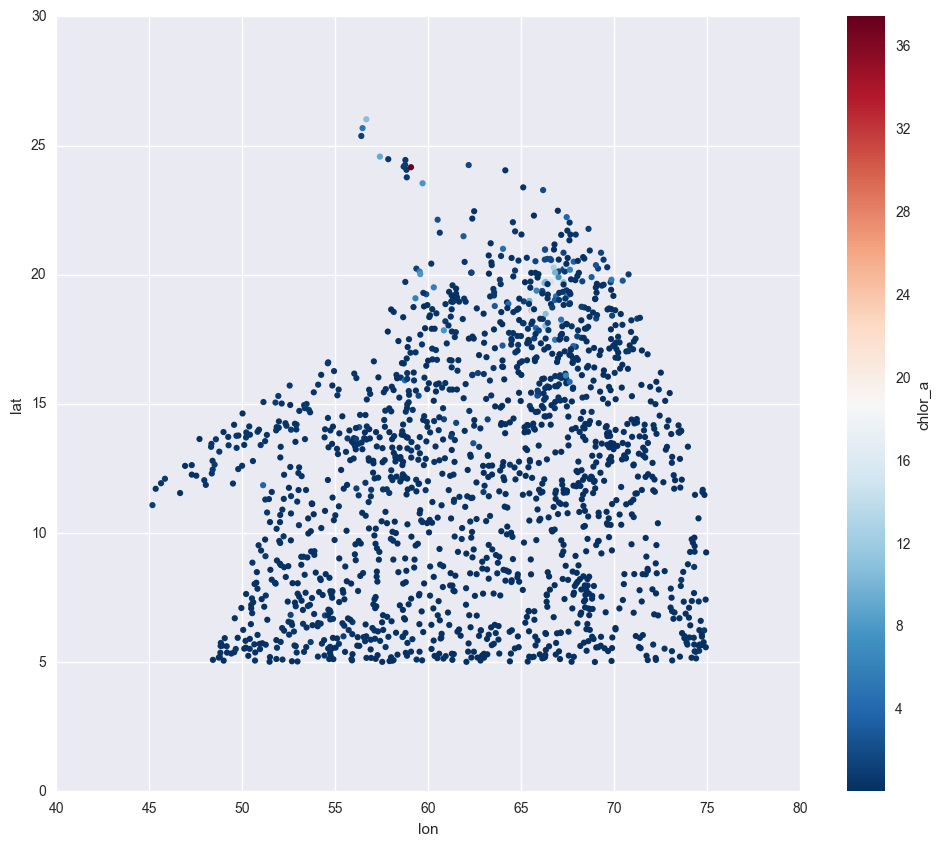

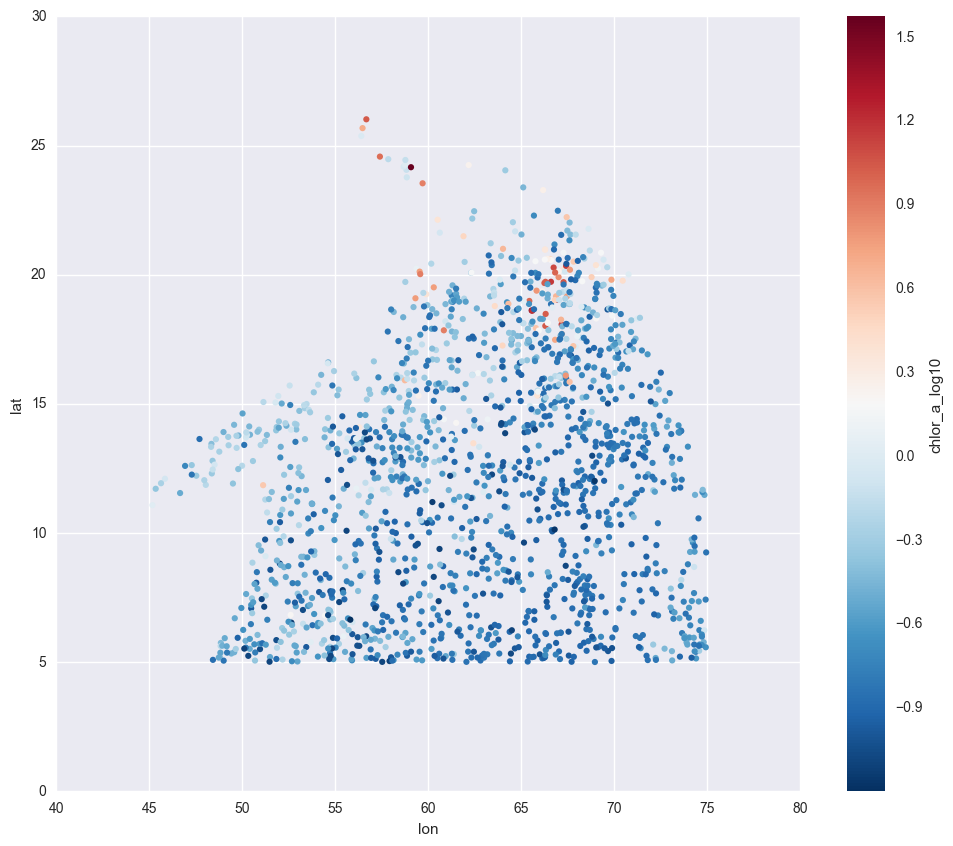

In [375]:
# tmp.to_series() to transfer it from xarray dataset to series
floatsDFAll_9Dtimeorder['chlor_a'] = pd.Series(np.array(tmpAll.to_series()), index=floatsDFAll_9Dtimeorder.index)
print("after editing the dataframe the nan values in 'chlor_a' is", floatsDFAll_9Dtimeorder.chlor_a.isnull().sum() )  # they should be the same values as above

# take a look at the data
floatsDFAll_9Dtimeorder

# visualize the float around the arabian sea region
fig, ax  = plt.subplots(figsize=(12,10))
floatsDFAll_9Dtimeorder.plot(kind='scatter', x='lon', y='lat', c='chlor_a', cmap='RdBu_r', edgecolor='none', ax=ax)

def scale(x):
    logged = np.log10(x)
    return logged

#print(floatsAll_timeorder['chlor_a'].apply(scale))
floatsDFAll_9Dtimeorder['chlor_a_log10'] = floatsDFAll_9Dtimeorder['chlor_a'].apply(scale)
floatsDFAll_9Dtimeorder
#print("after the transformation the nan values in 'chlor_a_log10' is", floatsAll_timeorder.chlor_a_log10.isnull().sum() )

# visualize the float around the arabian sea region
fig, ax  = plt.subplots(figsize=(12,10))
floatsDFAll_9Dtimeorder.plot(kind='scatter', x='lon', y='lat', c='chlor_a_log10', cmap='RdBu_r', edgecolor='none', ax=ax)
floatsDFAll_9Dtimeorder.chlor_a.dropna().shape  # (1631,)
#floatsDFAll_9Dtimeorder.chlor_a_log10.dropna().shape  # (1631,)

In [376]:
# take the diff of the chlor_a, and this has to be done in xarray
# transfer the dataframe into xarry dataset again
# take the difference
floatsDFAll_9Dtimeorder

,id,time,var_lat,vn,temp,lon,lat,var_tmp,var_lon,ve,spd,chlor_a,chlor_a_log10
0,7574,2002-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
568,10206,2002-07-04,0.001326,0.027056,NaN,66.533639,16.219000,1000.000000,0.005002,7.056056,8.462583,NaN,NaN
1136,10208,2002-07-04,0.000061,-8.270944,NaN,69.914139,13.599500,1000.000000,0.000116,12.942722,17.918639,NaN,NaN
1704,11089,2002-07-04,0.000065,-14.363611,27.796889,65.036972,16.068778,0.003620,0.000123,11.143806,20.217250,NaN,NaN
2272,15703,2002-07-04,0.000054,-7.037222,28.572750,69.915889,13.637028,0.088844,0.000099,11.706389,16.841889,NaN,NaN
2840,15707,2002-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3408,27069,2002-07-04,0.000056,-1.797889,28.981389,69.445889,20.077750,0.001708,0.000102,24.130583,25.498500,NaN,NaN
3976,27139,2002-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4544,28842,2002-07-04,0.000099,-8.122111,27.620472,60.830556,18.624861,0.003344,0.000208,5.026861,18.067944,NaN,NaN
5112,34159,2002-07-04,0.000059,16.704556,NaN,59.736889,12.894139,1000.000000,0.000112,31.753083,37.039111,NaN,NaN


In [377]:
# unstack() will provide a 2d dataframe
# reset_index() will reset all the index as columns

check the sum of the chlor_a before the merge -64.3533472159612
check the sum of the chlor_a after the merge -64.3533472159612


(417,)

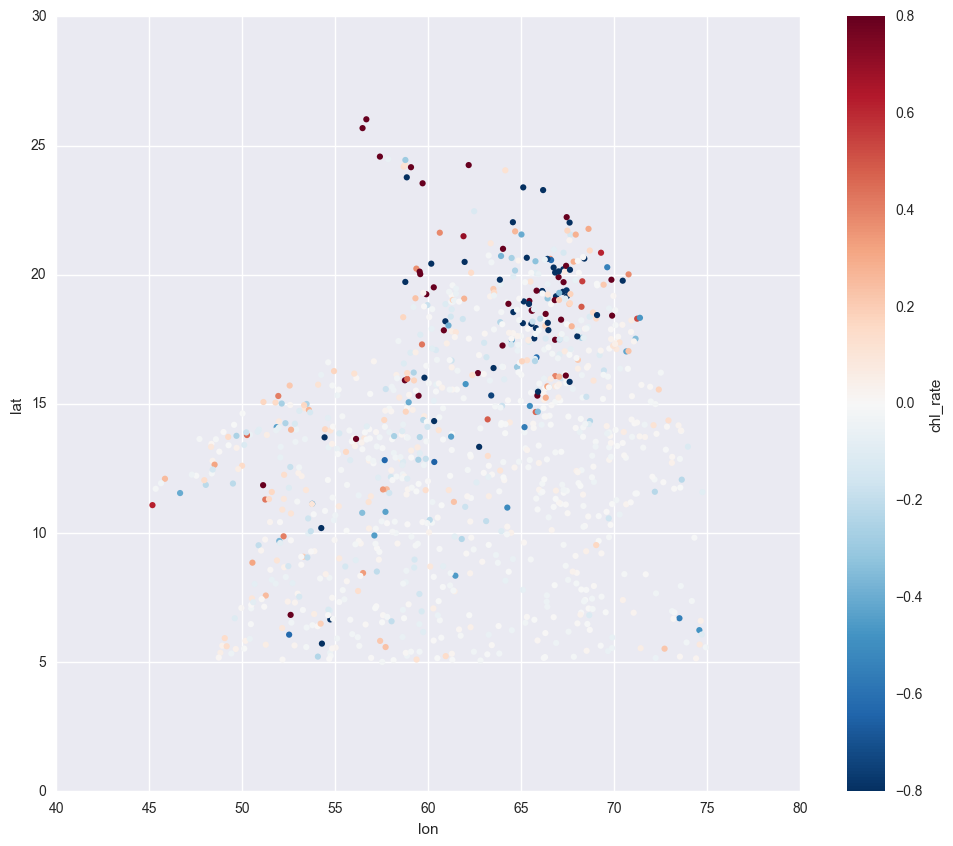

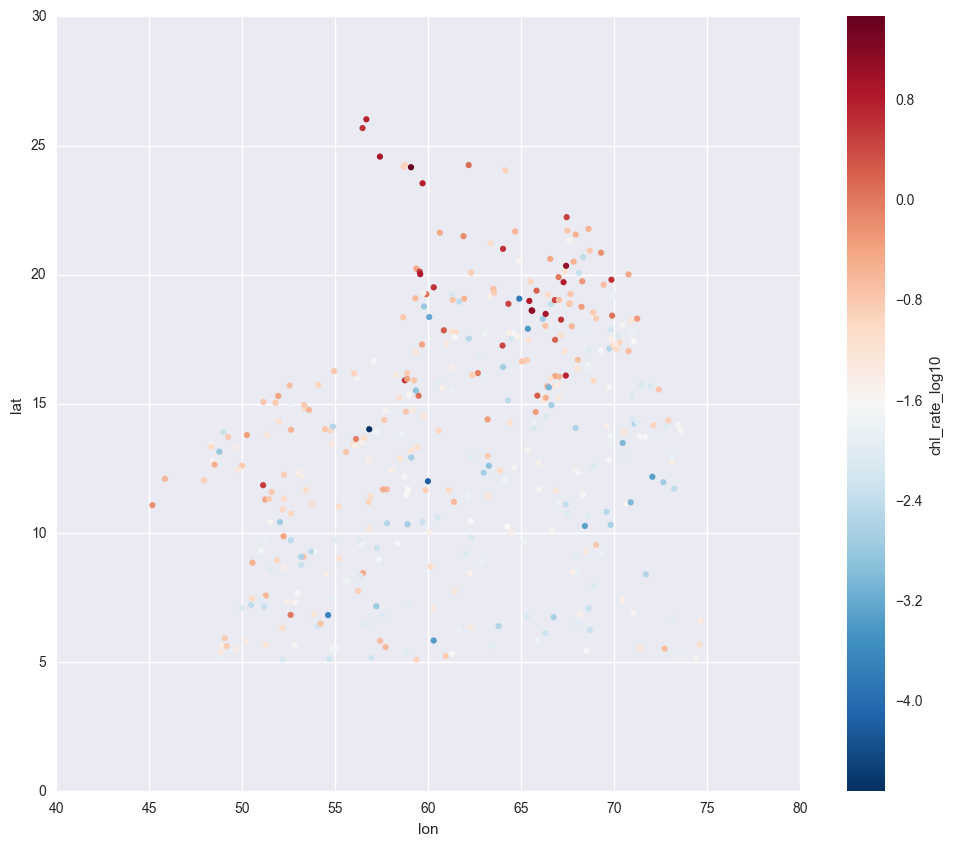

In [378]:
# prepare the data in dataset and about to take the diff
tmp = xr.Dataset.from_dataframe(floatsDFAll_9Dtimeorder.set_index(['time','id']) ) # set time & id as the index); use reset_index to revert this operation
# take the diff on the chlor_a
chlor_a_rate = tmp.diff(dim='time',n=1).chlor_a.to_series().reset_index()
# make the column to a proper name
chlor_a_rate.rename(columns={'chlor_a':'chl_rate'}, inplace='True')
chlor_a_rate


# merge the two dataframes {floatsDFAll_XDtimeorder; chlor_a_rate} into one dataframe based on the index {id, time} and use the left method
floatsDFAllRate_9Dtimeorder=pd.merge(floatsDFAll_9Dtimeorder,chlor_a_rate, on=['time','id'], how = 'left')
floatsDFAllRate_9Dtimeorder

# check 
print('check the sum of the chlor_a before the merge', chlor_a_rate.chl_rate.sum())
print('check the sum of the chlor_a after the merge',floatsDFAllRate_9Dtimeorder.chl_rate.sum())


# visualize the chlorophyll rate, it is *better* to visualize at this scale
fig, ax  = plt.subplots(figsize=(12,10))
floatsDFAllRate_9Dtimeorder.plot(kind='scatter', x='lon', y='lat', c='chl_rate', cmap='RdBu_r', vmin=-0.8, vmax=0.8, edgecolor='none', ax=ax)

# visualize the chlorophyll rate on the log scale
floatsDFAllRate_9Dtimeorder['chl_rate_log10'] = floatsDFAllRate_9Dtimeorder['chl_rate'].apply(scale)
floatsDFAllRate_9Dtimeorder
fig, ax  = plt.subplots(figsize=(12,10))
floatsDFAllRate_9Dtimeorder.plot(kind='scatter', x='lon', y='lat', c='chl_rate_log10', cmap='RdBu_r', edgecolor='none', ax=ax)
#floatsDFAllRate_9Dtimeorder.chl_rate.dropna().shape   # (1008,) data points
floatsDFAllRate_9Dtimeorder.chl_rate_log10.dropna().shape   # (417,)data points..... notice, chl_rate can be negative, so do not take log10

In [49]:
pd.to_datetime(floatsDFAllRate_9Dtimeorder.time)
type(pd.to_datetime(floatsDFAllRate_9Dtimeorder.time))
ts = pd.Series(0, index=pd.to_datetime(floatsDFAllRate_9Dtimeorder.time) ) # creat a target time series for masking purpose

# take the month out
month = ts.index.month 
# month.shape # a check on the shape of the month.
selector = ((11==month) | (12==month) | (1==month) | (2==month) | (3==month) )  
selector
print('shape of the selector', selector.shape)

print('all the data count in [11-01, 03-31]  is', floatsDFAllRate_9Dtimeorder[selector].chl_rate.dropna().shape) # total (672,)
print('all the data count is', floatsDFAllRate_9Dtimeorder.chl_rate.dropna().shape )   # total (1008,)

shape of the selector (147112,)
all the data count in [11-01, 03-31]  is (672,)
all the data count is (1008,)


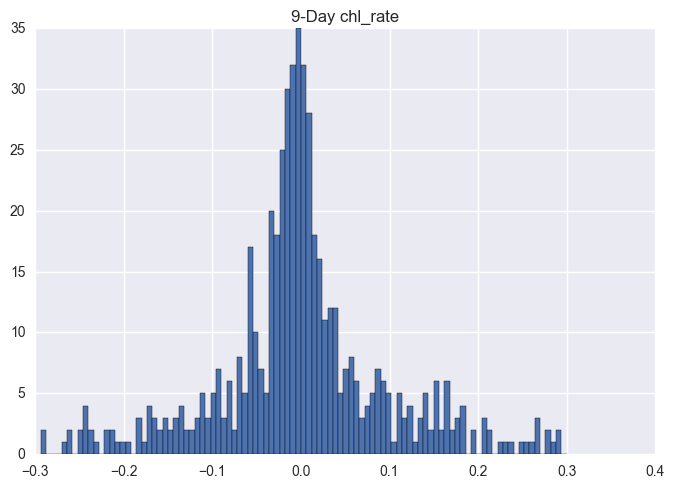

In [50]:
# histogram for non standarized data
axfloat = floatsDFAllRate_9Dtimeorder[selector].chl_rate.dropna().hist(bins=100,range=[-0.3,0.3])
axfloat.set_title('9-Day chl_rate')

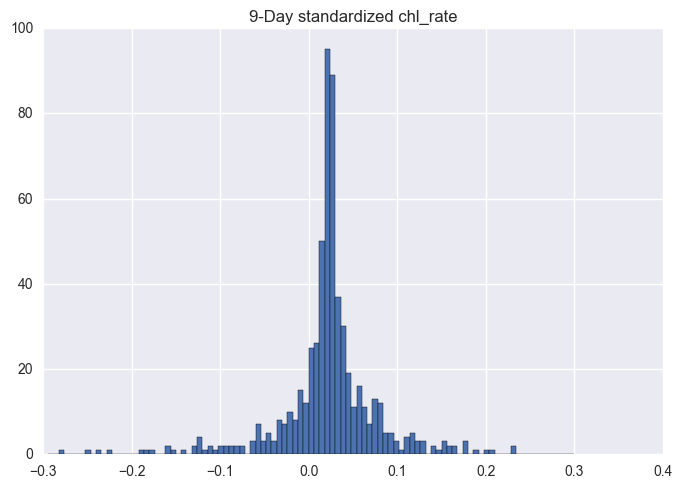

In [51]:
# standarized series
ts = floatsDFAllRate_9Dtimeorder[selector].chl_rate.dropna()
ts_standardized = (ts - ts.mean())/ts.std()
axts = ts_standardized.hist(bins=100,range=[-0.3,0.3])
axts.set_title('9-Day standardized chl_rate')

(47,)
(45,)
(7,)
(38,)
(105,)
(92,)
(140,)
(31,)
(62,)
(16,)
(32,)
(28,)
(198,)
(105,)
(55,)


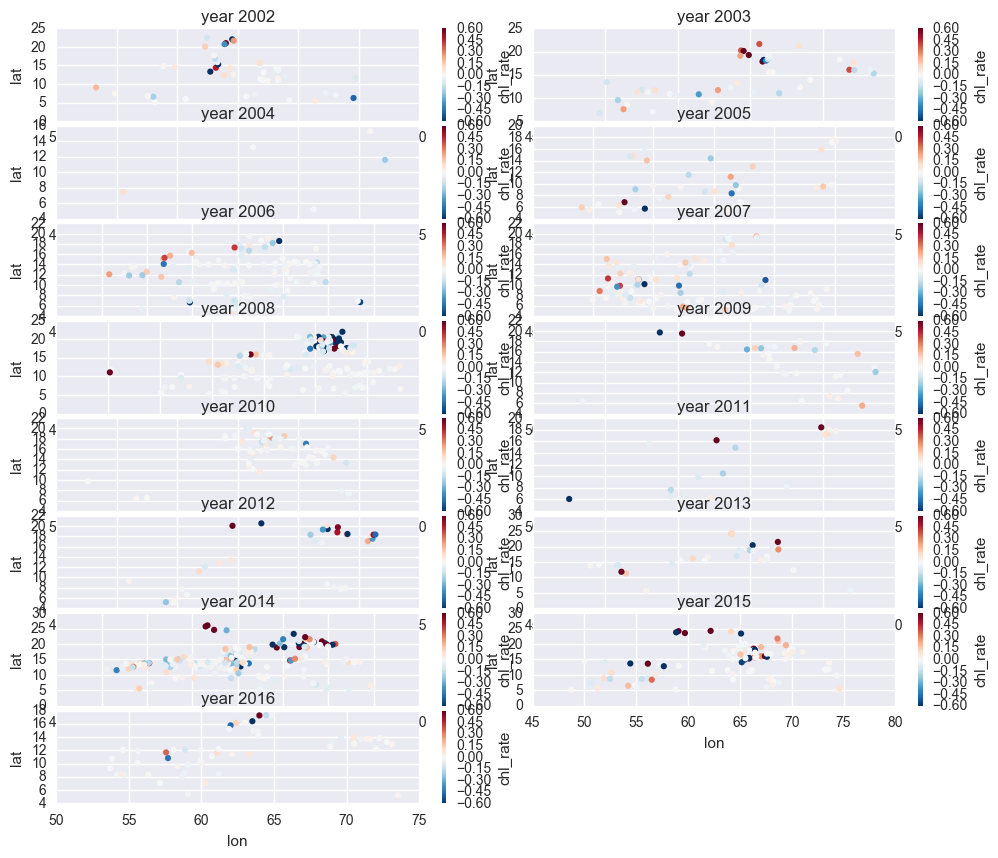

In [52]:
# all the data
fig, axes = plt.subplots(nrows=8, ncols=2, figsize=(12, 10))
fig.subplots_adjust(hspace=0.05, wspace=0.05)

for i, ax in zip(range(2002,2017), axes.flat) :
    tmpyear = floatsDFAllRate_9Dtimeorder[ (floatsDFAllRate_9Dtimeorder.time > str(i))  & (floatsDFAllRate_9Dtimeorder.time < str(i+1)) ] # if year i
    #fig, ax  = plt.subplots(figsize=(12,10))
    print(tmpyear.chl_rate.dropna().shape)   # total is 1001
    tmpyear.plot(kind='scatter', x='lon', y='lat', c='chl_rate', cmap='RdBu_r',vmin=-0.6, vmax=0.6, edgecolor='none', ax=ax)
    ax.set_title('year %g' % i)     
    
# remove the extra figure
ax = plt.subplot(8,2,16)
fig.delaxes(ax)

(58,)
(1,)
(9,)
(66,)
(44,)
(129,)
(28,)
(50,)
(5,)
(32,)
(0,)
(106,)
(91,)
(53,)


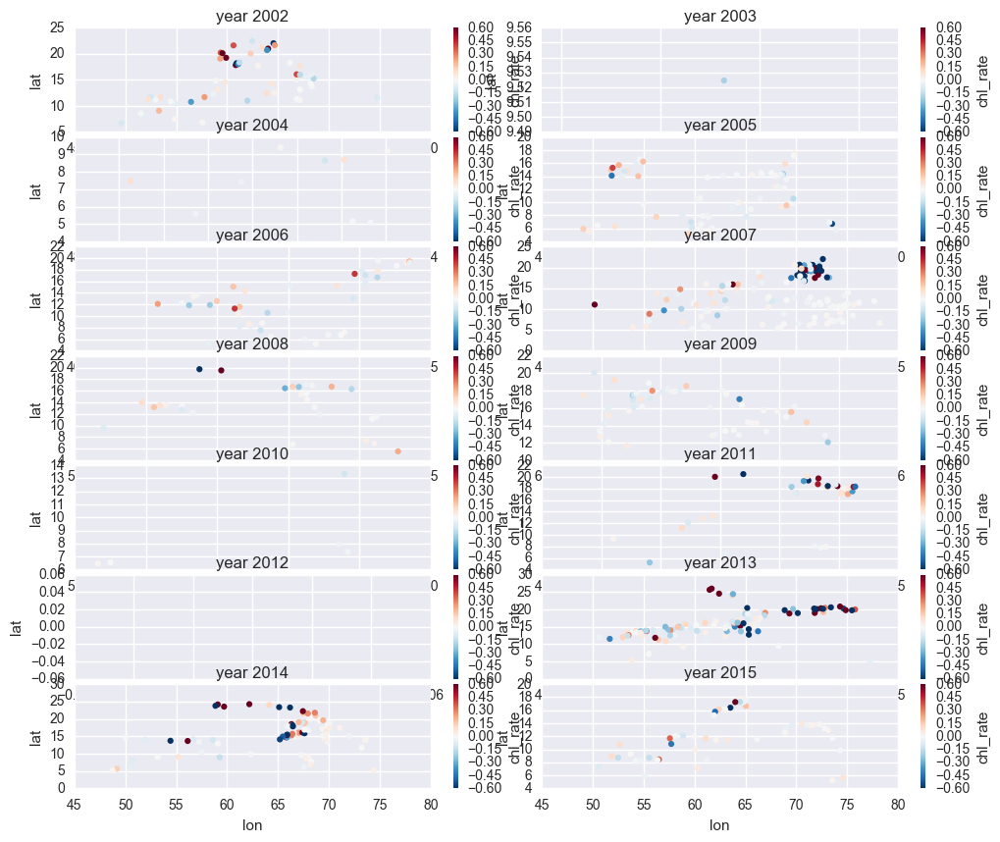

In [53]:
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(12, 10))
fig.subplots_adjust(hspace=0.05, wspace=0.05)

for i, ax in zip(range(2002,2016), axes.flat) :
    tmpyear = floatsDFAllRate_9Dtimeorder[ (floatsDFAllRate_9Dtimeorder.time >= (str(i)+ '-11-01') )  & (floatsDFAllRate_9Dtimeorder.time <= (str(i+1)+'-03-31') ) ] # if year i
    # select only particular month, Nov 1 to March 31
    #fig, ax  = plt.subplots(figsize=(12,10))
    print(tmpyear.chl_rate.dropna().shape)  # the total is 672
    tmpyear.plot(kind='scatter', x='lon', y='lat', c='chl_rate', cmap='RdBu_r', vmin=-0.6, vmax=0.6, edgecolor='none', ax=ax)
    ax.set_title('year %g' % i)  

In [104]:
# let's output the data as a csv or hdf file to disk to save the experiment time

df_list = []
for i in range(2002,2017) :
    tmpyear = floatsDFAllRate_9Dtimeorder[ (floatsDFAllRate_9Dtimeorder.time >= (str(i)+ '-11-01') )  & (floatsDFAllRate_9Dtimeorder.time <= (str(i+1)+'-03-31') ) ] # if year i
    # select only particular month, Nov 1 to March 31
    df_list.append(tmpyear)
    
df_tmp = pd.concat(df_list)
print('all the data count in [11-01, 03-31]  is ', df_tmp.chl_rate.dropna().shape) # again, the total is (692,)
df_chl_out_9D_modisa = df_tmp[~df_tmp.chl_rate.isnull()] # only keep the non-nan values
#list(df_chl_out_XD.groupby(['id']))   # can see the continuity pattern of the Lagarangian difference for each float id

# output to a csv or hdf file
df_chl_out_9D_modisa.head()

all the data count in [11-01, 03-31]  is  (672,)


,id,time,temp,var_lat,var_tmp,ve,var_lon,vn,lon,spd,lat,chlor_a,chlor_a_log10,chl_rate,chl_rate_log10
3627,10206,2002-11-07,NaN,0.000494,1000.000000,-2.217083,0.001535,2.990778,67.132000,5.446583,11.126222,0.130267,-0.885166,-0.004264,NaN
3629,11089,2002-11-07,28.829472,0.000064,0.003812,-16.412472,0.000123,-3.991722,64.391056,17.995028,14.279667,0.197237,-0.705012,0.074821,-1.125976
3631,15707,2002-11-07,NaN,0.000074,1000.000000,-12.316611,0.000147,-18.253056,67.155306,24.656417,13.142667,0.152200,-0.817584,-0.004472,NaN
3649,34710,2002-11-07,28.448167,0.000069,0.001857,-2.827667,0.000135,19.539861,63.041861,20.774778,17.717111,0.372568,-0.428795,0.018603,-1.730417
3886,10206,2002-11-16,NaN,0.001033,1000.000000,-1.089083,0.003872,0.501111,67.029167,4.028889,11.179833,0.145233,-0.837935,0.014966,-1.824894


In [105]:
df_chl_out_9D_modisa.index.name = 'index'  # make it specific for the index name

# CSV CSV CSV CSV with specfic index
df_chl_out_9D_modisa.to_csv('df_chl_out_9D_modisa.csv', sep=',', index_label = 'index')

# load CSV output
test = pd.read_csv('df_chl_out_9D_modisa.csv', index_col='index')
test.head()

,id,time,temp,var_lat,var_tmp,ve,var_lon,vn,lon,spd,lat,chlor_a,chlor_a_log10,chl_rate,chl_rate_log10
index,,,,,,,,,,,,,,,
3627,10206,2002-11-07,NaN,0.000494,1000.000000,-2.217083,0.001535,2.990778,67.132000,5.446583,11.126222,0.130267,-0.885166,-0.004264,NaN
3629,11089,2002-11-07,28.829472,0.000064,0.003812,-16.412472,0.000123,-3.991722,64.391056,17.995028,14.279667,0.197237,-0.705012,0.074821,-1.125976
3631,15707,2002-11-07,NaN,0.000074,1000.000000,-12.316611,0.000147,-18.253056,67.155306,24.656417,13.142667,0.152200,-0.817584,-0.004472,NaN
3649,34710,2002-11-07,28.448167,0.000069,0.001857,-2.827667,0.000135,19.539861,63.041861,20.774778,17.717111,0.372568,-0.428795,0.018603,-1.730417
3886,10206,2002-11-16,NaN,0.001033,1000.000000,-1.089083,0.003872,0.501111,67.029167,4.028889,11.179833,0.145233,-0.837935,0.014966,-1.824894
